In [84]:
import librosa # Imports the librosa library for audio analysis
import os # Imports the os library for interacting with the operating system

# Directory containing the uploaded audio files
upload_folder = "/content/"  # Replace with the correct path if necessary

# List to store the extracted audio files
audio_files = []
prova_audio = []
# Iterate over all files in the upload folder
for filename in os.listdir(upload_folder):
    if filename.endswith(('.flac', '.mp3', '.ogg')):  # Add other extensions if needed
        filepath = os.path.join(upload_folder, filename) # Creates the full path to the audio file
        try:
            # Load the audio file with librosa
            y, sr = librosa.load(filepath) # Loads the audio file using librosa.load()
            x = AudioSegment.from_file(filepath)
            audio_files.append((y, sr)) # Appends the  audio data (y), and sample rate (sr) to the audio_files list
            prova_audio.append(x)
            print(f"Audio file '{filename}' loaded successfully.") # Prints a success message
        except Exception as e:
            print(f"Error loading '{filename}': {e}") # Prints an error message if loading fails



Audio file 'LA_T_1001169.flac' loaded successfully.
Audio file 'LA_T_1000824.flac' loaded successfully.
Audio file 'LA_T_1001074.flac' loaded successfully.
Audio file 'LA_T_1000648.flac' loaded successfully.
Audio file 'LA_T_1001718.flac' loaded successfully.
Audio file 'LA_T_1000137.flac' loaded successfully.
Audio file 'LA_T_1000406.flac' loaded successfully.
Audio file 'LA_T_1001114.flac' loaded successfully.
Audio file 'LA_T_1001871.flac' loaded successfully.
Audio file 'LA_T_1002656.flac' loaded successfully.


In [86]:
# prompt: function to listent to the file

import librosa
import os
import matplotlib.pyplot as plt
import librosa.display
import numpy as np
from IPython.display import display, Audio

# ... (rest of the code from the previous response) ...

def listen_to_audio(y, sr):
    """Plays the audio file."""
    display(Audio(y, rate=sr))


# if audio_files:
#     for i, (y, sr) in enumerate(audio_files):
#         print(f"Audio file {i+1}:")
#         # plot_audio(y, sr)  # plot the waveform
#         listen_to_audio(y, sr) # Listen to audio
# else:
#     print("No audio files found or loaded successfully.")

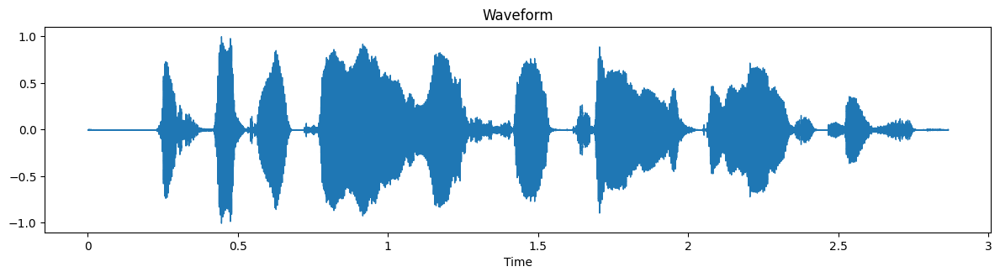

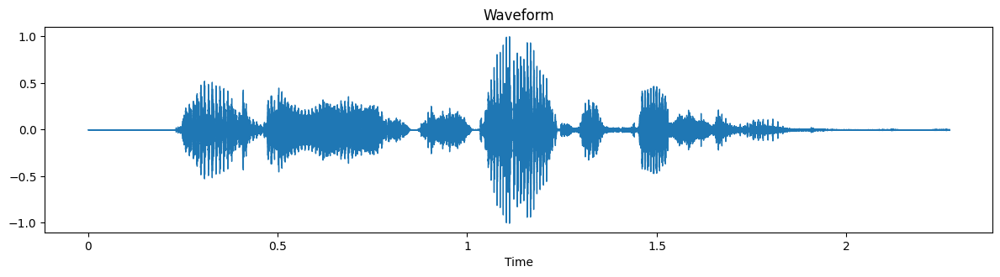

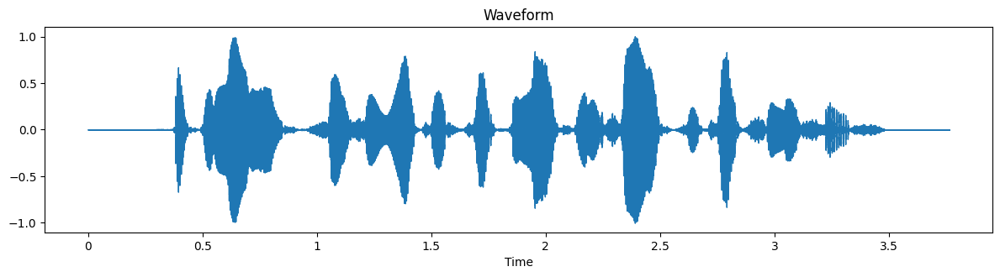

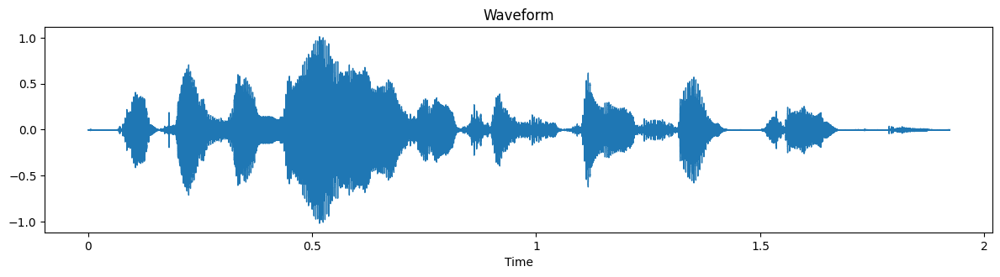

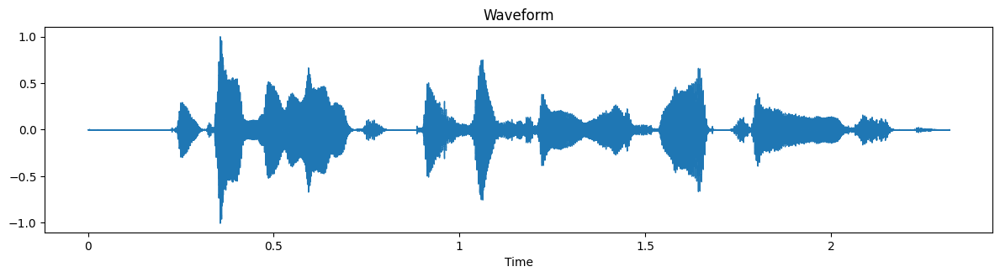

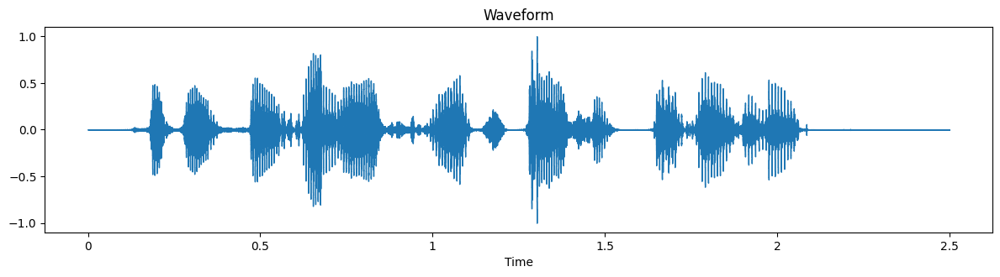

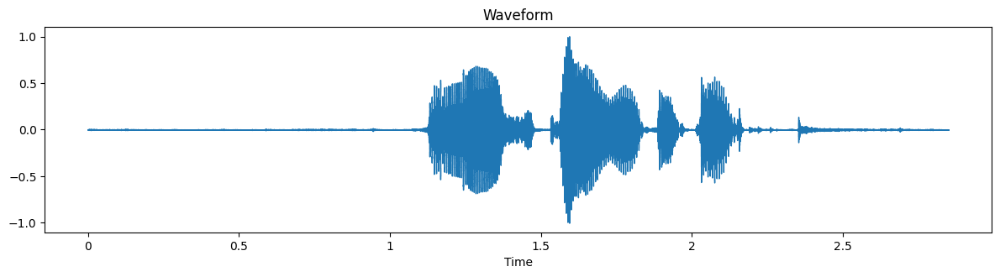

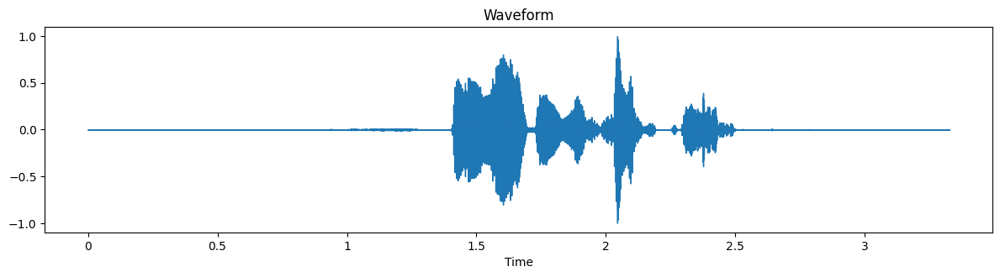

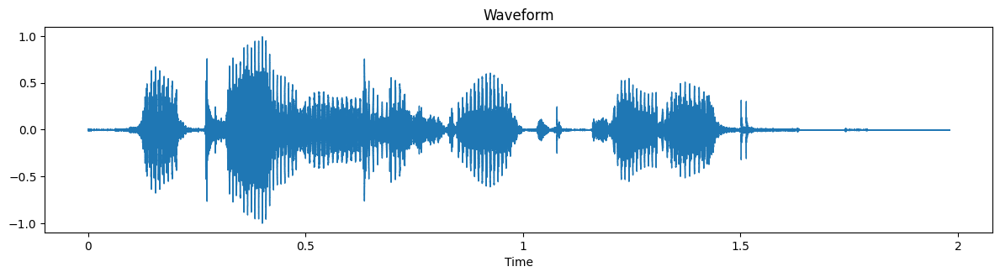

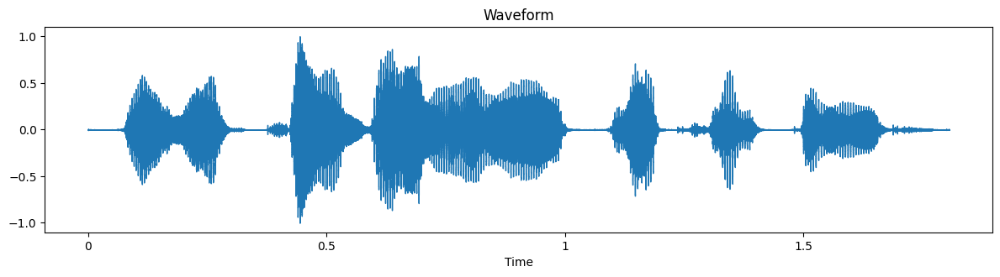

In [61]:
# prompt: a defintiizion that plot the audio

import matplotlib.pyplot as plt
import librosa.display

def plot_audio(y, sr):
  """Plots the waveform and spectrogram of an audio signal.

  Args:
      y: The audio time series.
      sr: The sampling rate of y.
  """
  plt.figure(figsize=(12, 6))

  # Plot the waveform
  plt.subplot(2, 1, 1)
  librosa.display.waveshow(y, sr=sr)
  plt.title("Waveform")

  # # Plot the spectrogram
  # plt.subplot(2, 1, 2)
  # D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)
  # librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
  # plt.colorbar(format='%+2.0f dB')
  # plt.title('Spectrogram')

  plt.tight_layout()
  plt.show()

# Example usage (assuming audio_files is defined as in the previous code)
import numpy as np

if audio_files:  # Check if audio_files is not empty
  for y, sr in audio_files:
    plot_audio(y, sr)
else:
  print("No audio files found or loaded successfully.")

63185


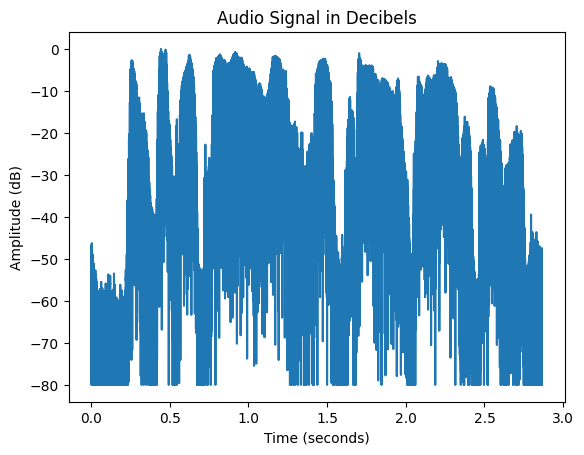

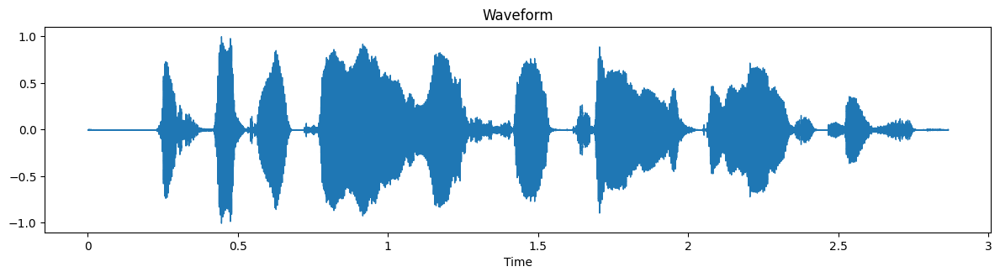

In [110]:
provaaa, sr = audio_files[0]

A = librosa.amplitude_to_db(provaaa, ref=np.max)
len(A)
print(len(A))
# Create the time axis for the plot
time_axis = np.arange(0, len(provaaa)) / sr

# Plot the decibel values against time
plt.plot(time_axis, A)
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude (dB)")
plt.title("Audio Signal in Decibels")
plt.show()

plot_audio(provaaa, sr)

In [129]:
u = (len(provaaa)*0.1)/3
print(provaaa[:int(1*u)])

print(u)

[-3.9468920e-03 -4.5941975e-03 -3.9157094e-03 ... -1.2423706e-04
 -1.1256120e-04 -9.4219889e-05]
2106.1666666666665


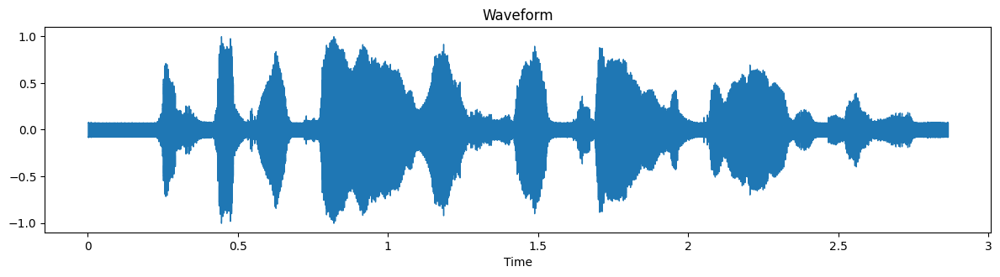

In [138]:
# prompt: Normalize the array to the range [-1, 1]

import numpy as np

def normalize_array(arr, min_val=-1, max_val=1):
  """Normalizes an array to a specified range.

  Args:
      arr: The input array.
      min_val: The minimum value of the output range.
      max_val: The maximum value of the output range.

  Returns:
      The normalized array.
  """
  arr_min = np.min(arr)
  arr_max = np.max(arr)

  # Handle cases where the array has a constant value
  if arr_min == arr_max:
    return np.full_like(arr, min_val)

  normalized_arr = (arr - arr_min) / (arr_max - arr_min)  # Normalize to [0, 1]
  normalized_arr = normalized_arr * (max_val - min_val) + min_val  # Scale to [min_val, max_val]
  return normalized_arr

# Example usage (assuming 'provaaa' is defined as in your provided code):
normalized_provaaa = normalize_array(provaaa)
plot_audio(normalized_provaaa, sr)

In [162]:
a = np.array(a)
u = (len(a)*0.1)/3


print(a[int(u*10):int(u*10.1)])

[0.18242045 0.19686577 0.20850743 0.22286966 0.24297439 0.26799038
 0.29381138 0.31502134 0.3270568  0.3276877  0.3174864  0.2993227
 0.27703702 0.25381038 0.23119567 0.20931384 0.18759567 0.16507295
 0.1402459  0.11152137 0.07816207 0.05843602 0.05272428 0.06123992
 0.08445816 0.12278006 0.15876254 0.19411255 0.23158123 0.2732425
 0.3192911  0.36728778 0.4123836  0.4495092  0.47635514 0.49456272
 0.5090587  0.52637863 0.55203295 0.58864844 0.63540244 0.6857516
 0.7241201  0.727545   0.67487603 0.559203   0.40669978 0.2734793
 0.15697975 0.07918645 0.06799527 0.08511588 0.06786948 0.08472311
 0.1441262  0.21919511 0.3125307  0.42584795 0.49815887 0.510627
 0.47132054 0.4044015  0.33961484 0.29995617 0.29354528 0.31296584
 0.34081587 0.35811657 0.35165015 0.31729025 0.2594001  0.18796855
 0.1225958  0.07419848 0.04356177 0.03086341 0.03442566 0.04321994
 0.05343754 0.06877587 0.08956257 0.11338468 0.13566755 0.15028605
 0.15103966 0.13323352 0.10607646 0.09204102 0.09369177 0.1136542
 0

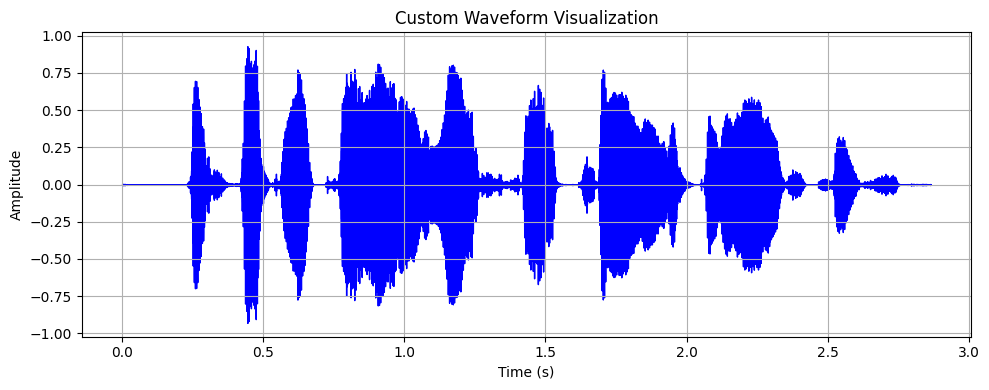

In [159]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter1d

def custom_waveshow(y, sr=22050, max_points=11025, axis='time', offset=0.0, **kwargs):
    """
    Custom implementation of librosa.display.waveshow.

    Parameters:
    - y (ndarray): The audio signal (1D array).
    - sr (int): Sampling rate of the signal.
    - max_points (int): Maximum number of points for sample-based view.
    - axis (str): Units for the x-axis ('time' for seconds).
    - offset (float): Offset start time for the waveform.
    - **kwargs: Additional keyword arguments for matplotlib.

    Returns:
    - None
    """
    # Determine the total duration of the audio
    duration = len(y) / sr  # in seconds

    # Time axis for the waveform
    time = np.arange(len(y)) / sr + offset

    # Adaptive rendering: Check if the plot duration is short
    if duration <= max_points / sr:
        # Detailed sample-based view
        plt.step(time, y, where="post", **kwargs)
    else:
        # Downsample for amplitude envelope
        downsample_factor = max(1, len(y) // max_points)

        # Compute the amplitude envelope
        envelope = uniform_filter1d(np.abs(y), size=downsample_factor)
        envelope_time = time[::downsample_factor]  # Time for downsampled points

        # Plot amplitude envelope
        # Remove 'alpha' from kwargs if present to avoid conflict

        fill_between_kwargs = kwargs.copy()
        fill_between_kwargs.pop('alpha', None)  # Remove 'alpha' if it exists

        plt.fill_between(
            envelope_time,
            envelope[::downsample_factor],
            -envelope[::downsample_factor],
            #alpha=0.6, #This may be causing a conflict
            **fill_between_kwargs, #Use the modified kwargs without 'alpha' here.
        )

    # Set axis labels and limits
    if axis == 'time':
        plt.xlabel("Time (s)")
    elif axis == 'frames':
        plt.xlabel("Frames")
    plt.ylabel("Amplitude")

    # Add grid for better readability
    plt.grid(True)
    return envelope

# Example usage
if __name__ == "__main__":


    # Load an example audio file
    y, sr = audio_files[0]

    # Plot the waveform
    plt.figure(figsize=(10, 4))
    a = custom_waveshow(y, sr=sr, max_points=11025, color="blue", alpha=0.8)
    plt.title("Custom Waveform Visualization")
    plt.tight_layout()
    plt.show()



In [179]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter1d

def custom_waveshow(y, sr=22050, max_points=11025, axis='time', offset=0.0, **kwargs):
    """
    Custom implementation of librosa.display.waveshow.

    Parameters:
    - y (ndarray): The audio signal (1D array).
    - sr (int): Sampling rate of the signal.
    - max_points (int): Maximum number of points for sample-based view.
    - axis (str): Units for the x-axis ('time' for seconds).
    - offset (float): Offset start time for the waveform.
    - **kwargs: Additional keyword arguments for matplotlib.

    Returns:
    - None
    """
    # Determine the total duration of the audio
    duration = len(y) / sr  # in seconds

    # Time axis for the waveform
    time = np.arange(len(y)) / sr + offset

    # Adaptive rendering: Check if the plot duration is short
    if duration <= max_points / sr:
        # Detailed sample-based view
        plt.step(time, y, where="post", **kwargs)
    else:
        # Downsample for amplitude envelope
        downsample_factor = max(1, len(y) // max_points)

        # Compute the amplitude envelope
        envelope = uniform_filter1d(np.abs(y), size=downsample_factor)
        envelope_time = time[::downsample_factor]  # Time for downsampled points

        # Plot amplitude envelope
        # Remove 'alpha' from kwargs if present to avoid conflict

        fill_between_kwargs = kwargs.copy()
        fill_between_kwargs.pop('alpha', None)  # Remove 'alpha' if it exists

        # plt.fill_between(
        #     envelope_time,
        #     envelope[::downsample_factor],
        #     -envelope[::downsample_factor],
        #     #alpha=0.6, #This may be causing a conflict
        #     **fill_between_kwargs, #Use the modified kwargs without 'alpha' here.
        # )

    # Set axis labels and limits
    # if axis == 'time':
    #     plt.xlabel("Time (s)")
    # elif axis == 'frames':
    #     plt.xlabel("Frames")
    # plt.ylabel("Amplitude")

    # # Add grid for better readability
    # plt.grid(True)
    return envelope

def extract_silence_from_audio(y, sr, threshold):
    amplitude = custom_waveshow(y, sr=sr, max_points=11025, color="blue", alpha=0.8)
    tmp = amplitude
    sil = np.zeros(len(tmp))
    counter = 0
    for i in range(0, len(tmp)):
      if tmp[i] < threshold:
        sil[counter] = tmp[i]
        counter = counter + 1
    C = sil[:counter]
    return C


In [168]:
tmp = a
sil = np.zeros(len(tmp))
counter = 0
for i in range(0, len(tmp)):
  if tmp[i] < 0.01:
    sil[counter] = tmp[i]
    counter = counter + 1

print(counter)
C = sil[:counter]

18530


In [183]:
i, sr = audio_files[3]

po = extract_silence_from_audio(i, sr, 0.02)


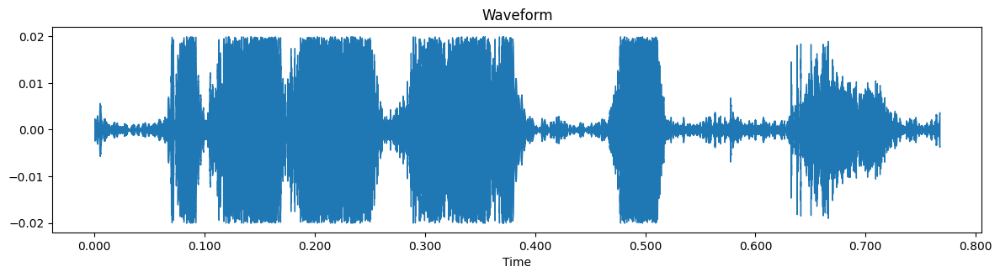

In [184]:
# C = librosa.db_to_amplitude(provaaa, ref=np.min(provaaa))
listen_to_audio(po, sr)
plot_audio(po, sr)

In [79]:
!pip install pydub

In [95]:
# prompt: a function to extract the silence from the audio given using pydub

from pydub import AudioSegment
from pydub.silence import split_on_silence

def extract_silence(audio, min_silence_len=500, silence_thresh=-30, keep_silence=100):
    """
    Extracts silence segments from an audio file.

    Args:
        audio_file_path: Path to the audio file.
        min_silence_len: Minimum length of silence in milliseconds.
        silence_thresh: Silence threshold in dBFS.
        keep_silence: Amount of silence to keep around the detected silence (in milliseconds).

    Returns:
        A list of AudioSegment objects representing the silence segments.
        Returns None if the audio file cannot be loaded.
    """


    audio_chunks = split_on_silence(audio, min_silence_len=min_silence_len, silence_thresh=silence_thresh, keep_silence=keep_silence)
    silence_segments = []

    for i, chunk in enumerate(audio_chunks):
        if len(chunk) > 0 : # make sure chunk is not empty
          silence_segments.append(chunk)

    return silence_segments

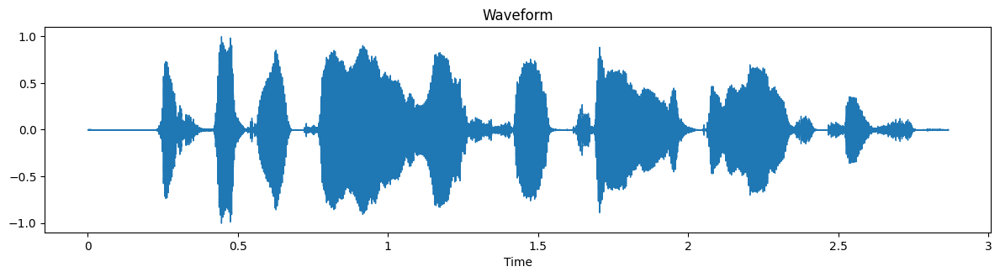

Playing silence segment 1


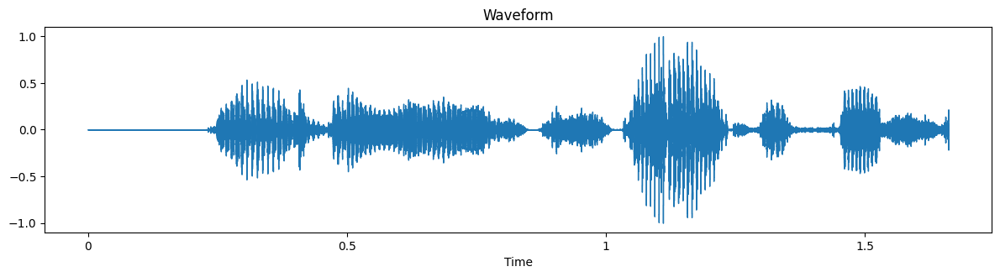

Playing silence segment 1


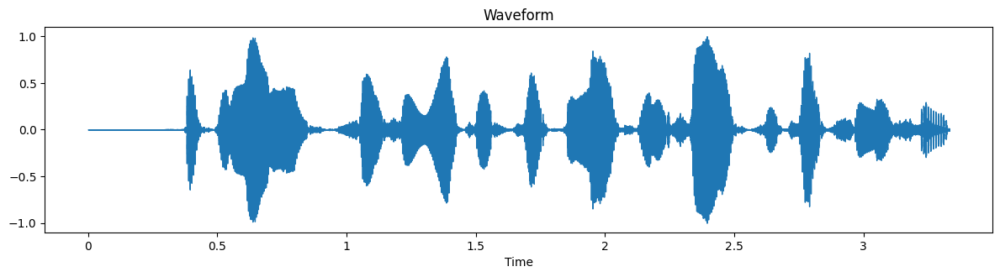

Playing silence segment 1


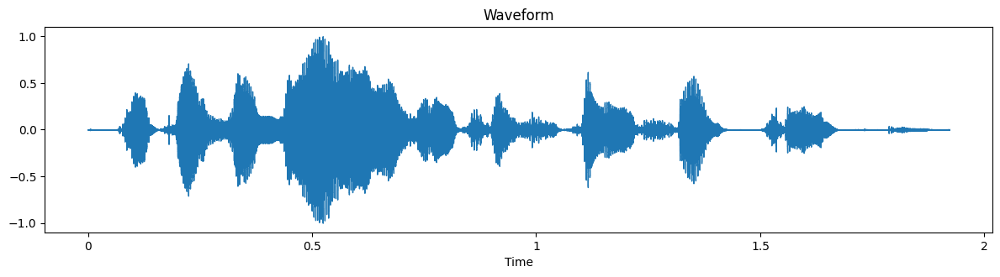

Playing silence segment 1


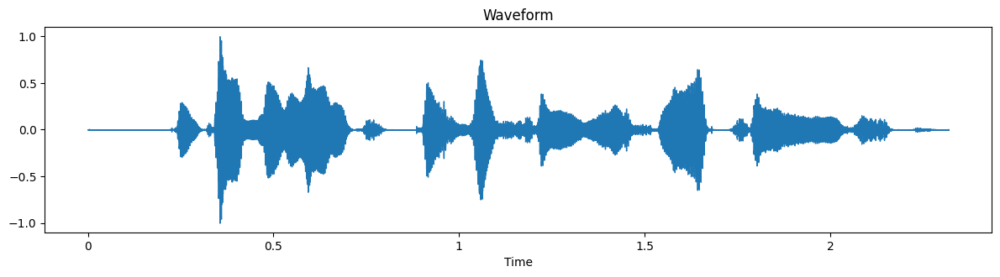

Playing silence segment 1


In [103]:
import IPython.display as ipd
import numpy as np  # Import numpy

silence = []
diocane = prova_audio[:5]
if prova_audio:
  for audio in diocane:
    silence_segments = extract_silence(audio)

    # Convert AudioSegment to numpy array before plotting
    for segment in silence_segments:
        # Get the samples as a NumPy array
        samples = np.array(segment.get_array_of_samples())

        # Convert samples to floating-point by dividing by the maximum possible value
        samples = samples.astype(np.float32) / np.iinfo(samples.dtype).max
        plot_audio(samples, segment.frame_rate)
        # librosa.display.waveshow(samples, sr=segment.frame_rate) # Use segment.frame_rate for sr

    if silence_segments:
      for i, segment in enumerate(silence_segments):
          print(f"Playing silence segment {i + 1}")

          ipd.display(ipd.Audio(segment.raw_data, rate=segment.frame_rate))
    else:
      print("No silence segments found in this audio file.")
else:
    print("No audio files loaded.")

### segmentare il silenzio a mano

In [17]:
print(audio_files[1][0])
## sr = audio_files[:][1]
## y = audio_files[:][0]


[ 1.1001241e-02  1.2605440e-02  1.1188789e-02 ... -3.9819701e-12
 -5.7635329e-12 -3.9264043e-12]


In [5]:
silence = []
noisy = []

In [32]:
print(len(tmp))
u = (len(tmp)*0.1)/2.5
print((len(tmp)*0.1)/2.5)

50090
2003.6


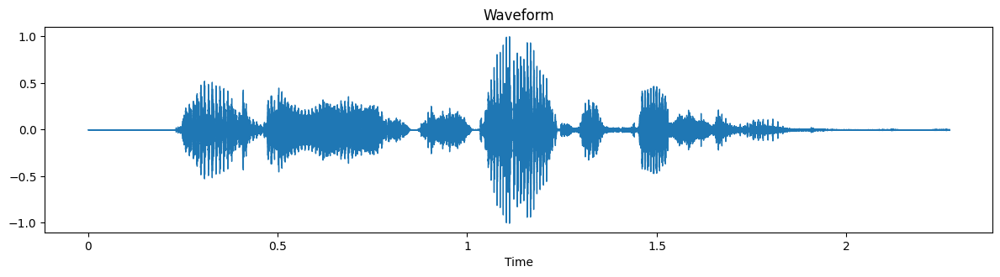

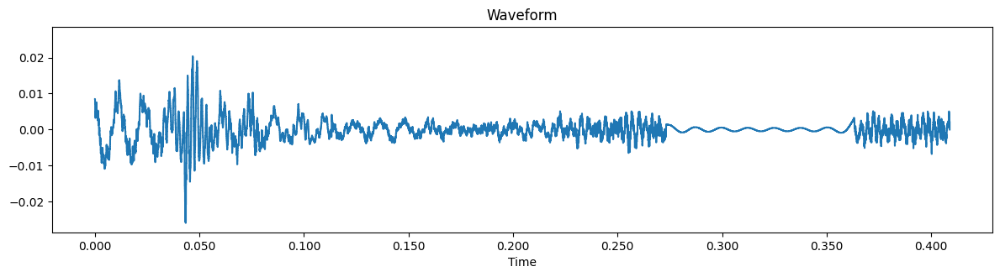

In [46]:
tmp = audio_files[1][0]
plot_audio(tmp, audio_files[1][1])

tmp_s = tmp[int(20.5*u):]
plot_audio(tmp_s, audio_files[0][1])
listen_to_audio(tmp_s, audio_files[0][1])

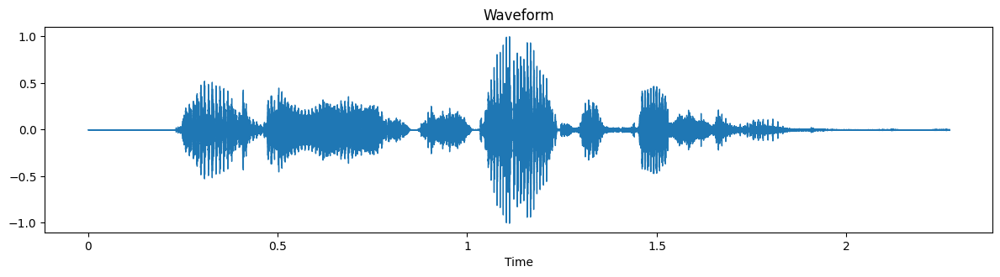

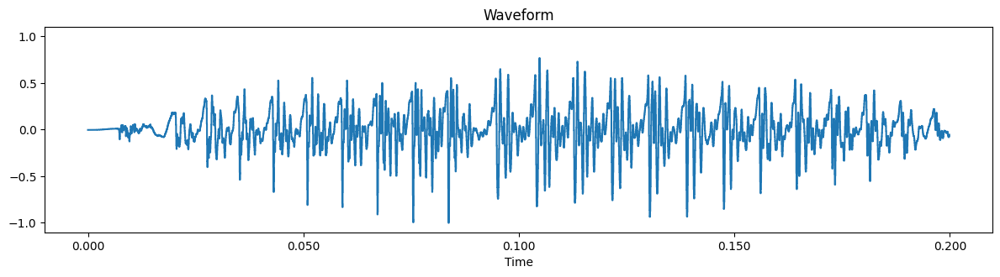

In [43]:
tmp = audio_files[1][0]
plot_audio(tmp, audio_files[1][1])

tmp_c = tmp[int(11.3*u):int(13.5*u)]
plot_audio(tmp_c, audio_files[1][1])
listen_to_audio(tmp_c, audio_files[1][1])

In [44]:
noisy.append(tmp_c)
print(len(noisy))

3


In [47]:
silence.append(tmp_s)
print(len(silence))

4


###to save the trainin data

In [51]:
# prompt: save in txt file a variable(not numpy)

import numpy as np

# Assuming 'tmp_s' and 'tmp_c' are defined as in your previous code
# and are NumPy arrays representing audio segments.


# Convert NumPy arrays to lists if they aren't already
if isinstance(tmp_s, np.ndarray):
    tmp_s = tmp_s.tolist()
if isinstance(tmp_c, np.ndarray):
    tmp_c = tmp_c.tolist()

with open('silence.txt', 'w') as f:
    for item in tmp_s:
        f.write("%s\n" % item)

with open('noisy.txt', 'w') as f:
    for item in tmp_c:
        f.write("%s\n" % item)

In [52]:
# prompt: extract the value from silence.txt and noisy.txt

import numpy as np

# Assuming tmp_s and tmp_c are defined and are NumPy arrays
# Example:
# tmp_s = np.array([1, 2, 3])
# tmp_c = np.array([4, 5, 6])


# Load data from silence.txt and noisy.txt
silence_data = []
noisy_data = []

try:
  with open('silence.txt', 'r') as f:
    for line in f:
        try:
            silence_data.append(float(line.strip()))
        except ValueError:
            print(f"Skipping invalid line in silence.txt: {line.strip()}")

  with open('noisy.txt', 'r') as f:
    for line in f:
        try:
            noisy_data.append(float(line.strip()))
        except ValueError:
            print(f"Skipping invalid line in noisy.txt: {line.strip()}")

except FileNotFoundError:
  print("One or both of the files (silence.txt or noisy.txt) were not found.")


# Now silence_data and noisy_data contain the extracted values
print("Silence data:", silence_data)
print("Noisy data:", noisy_data)


#Example usage of extracted data
if silence_data and noisy_data:
    silence_array = np.array(silence_data)
    noisy_array = np.array(noisy_data)
    print("Silence array:", silence_array)
    print("Noisy array:", noisy_array)
    # ... further processing with NumPy arrays ...

Silence data: [0.008485307916998863, 0.007216642610728741, 0.005179795436561108, 0.003578050294891, 0.003231765702366829, 0.003950512036681175, 0.004671854432672262, 0.004935831297188997, 0.004932643845677376, 0.004564776550978422, 0.004132877569645643, 0.004120606929063797, 0.004333555698394775, 0.004960410296916962, 0.006296917796134949, 0.0074289836920797825, 0.007585055194795132, 0.006910366006195545, 0.005521446466445923, 0.004040074534714222, 0.0034405456390231848, 0.003702751826494932, 0.004341473802924156, 0.004926613532006741, 0.0048006330616772175, 0.003996013663709164, 0.0032691569067537785, 0.00283407443203032, 0.0025547859258949757, 0.0026588307227939367, 0.0034283928107470274, 0.00459463382139802, 0.005276832729578018, 0.0049803247675299644, 0.004061263520270586, 0.0028351563960313797, 0.001648613135330379, 0.0011798026971518993, 0.0015252453740686178, 0.002326726447790861, 0.003065020078793168, 0.002520511392503977, 0.00044395955046638846, -0.0012949270894750953, -0.0014

In [59]:
print(silence_array[0])
print(audio_files[5][1])

0.008485307916998863
22050


In [27]:
# prompt: how to access to noisy.npy

import numpy as np

noisy_audio = np.load('noisy.npy')
print(noisy_audio )

['3e3r3']


### NN to extract

### Funzione per il silenzio

In [15]:
# prompt: can you extract the silence from the audio?

import librosa
import numpy as np

# Assuming audio_files list is populated from the previous code

for i, (y, sr) in enumerate(audio_files):
    # Calculate the short-time energy of the audio signal
    frame_length = 2048  # Adjust as needed
    hop_length = 512  # Adjust as needed
    energy = librosa.feature.rms(y=y, frame_length=frame_length, hop_length=hop_length)[0]

    # Set a threshold for silence detection (adjust as needed)
    threshold = np.mean(energy) * 0.1  # Example: 10% of the average energy

    # Find the frames where the energy is below the threshold
    silent_frames = np.where(energy < threshold)[0]

    # Convert frame indices to time indices
    silent_times = librosa.frames_to_time(silent_frames, sr=sr, hop_length=hop_length)

    # Extract the silent segments from the audio signal
    silence = []
    for j in range(len(silent_times) -1):
        start_sample = int(librosa.time_to_samples(silent_times[j], sr=sr))
        end_sample = int(librosa.time_to_samples(silent_times[j+1], sr=sr))

        #check if its actually silence
        if end_sample - start_sample > 0 :
            silence.append(y[start_sample:end_sample])

    # You can now process or save the silence segments
    print(f"Extracted silence segments from audio file {i+1}")

    #Example: save to a file.
    #for k, segment in enumerate(silence):
        #librosa.output.write_wav(f"silence_{i+1}_{k}.wav", segment, sr)

Extracted silence segments from audio file 1
Extracted silence segments from audio file 2
Extracted silence segments from audio file 3
Extracted silence segments from audio file 4
Extracted silence segments from audio file 5
Extracted silence segments from audio file 6
Extracted silence segments from audio file 7
Extracted silence segments from audio file 8
Extracted silence segments from audio file 9
Extracted silence segments from audio file 10
Extracted silence segments from audio file 11
Extracted silence segments from audio file 12
Extracted silence segments from audio file 13
Extracted silence segments from audio file 14
Extracted silence segments from audio file 15
Extracted silence segments from audio file 16
Extracted silence segments from audio file 17
Extracted silence segments from audio file 18
Extracted silence segments from audio file 19
Extracted silence segments from audio file 20
Extracted silence segments from audio file 21
Extracted silence segments from audio file 

In [16]:
# prompt: plot and play the segment of silence

import IPython.display as ipd

# Assuming audio_files and the silence segments are already extracted as in the previous code

for i, (y, sr) in enumerate(audio_files):
    # Calculate the short-time energy of the audio signal
    frame_length = 2048  # Adjust as needed
    hop_length = 512  # Adjust as needed
    energy = librosa.feature.rms(y=y, frame_length=frame_length, hop_length=hop_length)[0]

    # Set a threshold for silence detection (adjust as needed)
    threshold = np.mean(energy) * 0.1  # Example: 10% of the average energy

    # Find the frames where the energy is below the threshold
    silent_frames = np.where(energy < threshold)[0]

    # Convert frame indices to time indices
    silent_times = librosa.frames_to_time(silent_frames, sr=sr, hop_length=hop_length)

    # Extract the silent segments from the audio signal
    silence = []
    for j in range(len(silent_times) -1):
        start_sample = int(librosa.time_to_samples(silent_times[j], sr=sr))
        end_sample = int(librosa.time_to_samples(silent_times[j+1], sr=sr))

        #check if its actually silence
        if end_sample - start_sample > 0 :
            silence.append(y[start_sample:end_sample])

    print(f"Extracted silence segments from audio file {i+1}")

    # Play each silence segment
    for k, segment in enumerate(silence):
        print(f"Playing silence segment {k+1} from audio file {i+1}")
        ipd.display(ipd.Audio(segment, rate=sr))

Extracted silence segments from audio file 1
Playing silence segment 1 from audio file 1


Playing silence segment 2 from audio file 1


Playing silence segment 3 from audio file 1


Playing silence segment 4 from audio file 1


Playing silence segment 5 from audio file 1


Playing silence segment 6 from audio file 1


Playing silence segment 7 from audio file 1


Playing silence segment 8 from audio file 1


Playing silence segment 9 from audio file 1


Playing silence segment 10 from audio file 1


Playing silence segment 11 from audio file 1


Playing silence segment 12 from audio file 1


Playing silence segment 13 from audio file 1


Playing silence segment 14 from audio file 1


Playing silence segment 15 from audio file 1


Playing silence segment 16 from audio file 1


Playing silence segment 17 from audio file 1


Playing silence segment 18 from audio file 1


Playing silence segment 19 from audio file 1


Playing silence segment 20 from audio file 1


Playing silence segment 21 from audio file 1


Playing silence segment 22 from audio file 1


Playing silence segment 23 from audio file 1


Playing silence segment 24 from audio file 1


Playing silence segment 25 from audio file 1


Playing silence segment 26 from audio file 1


Playing silence segment 27 from audio file 1


Playing silence segment 28 from audio file 1


Playing silence segment 29 from audio file 1


Playing silence segment 30 from audio file 1


Playing silence segment 31 from audio file 1


Playing silence segment 32 from audio file 1


Playing silence segment 33 from audio file 1


Playing silence segment 34 from audio file 1


Playing silence segment 35 from audio file 1


Playing silence segment 36 from audio file 1


Playing silence segment 37 from audio file 1


Playing silence segment 38 from audio file 1


Playing silence segment 39 from audio file 1


Playing silence segment 40 from audio file 1


Playing silence segment 41 from audio file 1


Playing silence segment 42 from audio file 1


Playing silence segment 43 from audio file 1


Playing silence segment 44 from audio file 1


Playing silence segment 45 from audio file 1


Playing silence segment 46 from audio file 1


Playing silence segment 47 from audio file 1


Playing silence segment 48 from audio file 1


Playing silence segment 49 from audio file 1


Playing silence segment 50 from audio file 1


Playing silence segment 51 from audio file 1


Playing silence segment 52 from audio file 1


Playing silence segment 53 from audio file 1


Playing silence segment 54 from audio file 1


Playing silence segment 55 from audio file 1


Extracted silence segments from audio file 2
Playing silence segment 1 from audio file 2


Playing silence segment 2 from audio file 2


Playing silence segment 3 from audio file 2


Playing silence segment 4 from audio file 2


Playing silence segment 5 from audio file 2


Playing silence segment 6 from audio file 2


Playing silence segment 7 from audio file 2


Playing silence segment 8 from audio file 2


Playing silence segment 9 from audio file 2


Playing silence segment 10 from audio file 2


Playing silence segment 11 from audio file 2


Playing silence segment 12 from audio file 2


Playing silence segment 13 from audio file 2


Playing silence segment 14 from audio file 2


Playing silence segment 15 from audio file 2


Playing silence segment 16 from audio file 2


Playing silence segment 17 from audio file 2


Playing silence segment 18 from audio file 2


Playing silence segment 19 from audio file 2


Playing silence segment 20 from audio file 2


Playing silence segment 21 from audio file 2


Playing silence segment 22 from audio file 2


Playing silence segment 23 from audio file 2


Playing silence segment 24 from audio file 2


Playing silence segment 25 from audio file 2


Playing silence segment 26 from audio file 2


Playing silence segment 27 from audio file 2


Playing silence segment 28 from audio file 2


Playing silence segment 29 from audio file 2


Playing silence segment 30 from audio file 2


Playing silence segment 31 from audio file 2


Playing silence segment 32 from audio file 2


Playing silence segment 33 from audio file 2


Playing silence segment 34 from audio file 2


Playing silence segment 35 from audio file 2


Playing silence segment 36 from audio file 2


Playing silence segment 37 from audio file 2


Playing silence segment 38 from audio file 2


Playing silence segment 39 from audio file 2


Playing silence segment 40 from audio file 2


Playing silence segment 41 from audio file 2


Playing silence segment 42 from audio file 2


Playing silence segment 43 from audio file 2


Playing silence segment 44 from audio file 2


Playing silence segment 45 from audio file 2


Playing silence segment 46 from audio file 2


Playing silence segment 47 from audio file 2


Playing silence segment 48 from audio file 2


Playing silence segment 49 from audio file 2


Playing silence segment 50 from audio file 2


Playing silence segment 51 from audio file 2


Playing silence segment 52 from audio file 2


Playing silence segment 53 from audio file 2


Playing silence segment 54 from audio file 2


Playing silence segment 55 from audio file 2


Playing silence segment 56 from audio file 2


Playing silence segment 57 from audio file 2


Playing silence segment 58 from audio file 2


Playing silence segment 59 from audio file 2


Playing silence segment 60 from audio file 2


Playing silence segment 61 from audio file 2


Playing silence segment 62 from audio file 2


Playing silence segment 63 from audio file 2


Playing silence segment 64 from audio file 2


Playing silence segment 65 from audio file 2


Playing silence segment 66 from audio file 2


Playing silence segment 67 from audio file 2


Extracted silence segments from audio file 3
Playing silence segment 1 from audio file 3


Playing silence segment 2 from audio file 3


Playing silence segment 3 from audio file 3


Playing silence segment 4 from audio file 3


Playing silence segment 5 from audio file 3


Playing silence segment 6 from audio file 3


Playing silence segment 7 from audio file 3


Playing silence segment 8 from audio file 3


Playing silence segment 9 from audio file 3


Playing silence segment 10 from audio file 3


Playing silence segment 11 from audio file 3


Playing silence segment 12 from audio file 3


Playing silence segment 13 from audio file 3


Playing silence segment 14 from audio file 3


Playing silence segment 15 from audio file 3


Playing silence segment 16 from audio file 3


Playing silence segment 17 from audio file 3


Extracted silence segments from audio file 4
Playing silence segment 1 from audio file 4


Playing silence segment 2 from audio file 4


Playing silence segment 3 from audio file 4


Playing silence segment 4 from audio file 4


Playing silence segment 5 from audio file 4


Playing silence segment 6 from audio file 4


Playing silence segment 7 from audio file 4


Playing silence segment 8 from audio file 4


Playing silence segment 9 from audio file 4


Playing silence segment 10 from audio file 4


Playing silence segment 11 from audio file 4


Playing silence segment 12 from audio file 4


Playing silence segment 13 from audio file 4


Playing silence segment 14 from audio file 4


Playing silence segment 15 from audio file 4


Playing silence segment 16 from audio file 4


Playing silence segment 17 from audio file 4


Playing silence segment 18 from audio file 4


Playing silence segment 19 from audio file 4


Playing silence segment 20 from audio file 4


Playing silence segment 21 from audio file 4


Playing silence segment 22 from audio file 4


Playing silence segment 23 from audio file 4


Playing silence segment 24 from audio file 4


Playing silence segment 25 from audio file 4


Playing silence segment 26 from audio file 4


Playing silence segment 27 from audio file 4


Playing silence segment 28 from audio file 4


Playing silence segment 29 from audio file 4


Playing silence segment 30 from audio file 4


Playing silence segment 31 from audio file 4


Playing silence segment 32 from audio file 4


Playing silence segment 33 from audio file 4


Playing silence segment 34 from audio file 4


Playing silence segment 35 from audio file 4


Playing silence segment 36 from audio file 4


Playing silence segment 37 from audio file 4


Playing silence segment 38 from audio file 4


Playing silence segment 39 from audio file 4


Playing silence segment 40 from audio file 4


Playing silence segment 41 from audio file 4


Playing silence segment 42 from audio file 4


Playing silence segment 43 from audio file 4


Playing silence segment 44 from audio file 4


Playing silence segment 45 from audio file 4


Playing silence segment 46 from audio file 4


Playing silence segment 47 from audio file 4


Playing silence segment 48 from audio file 4


Playing silence segment 49 from audio file 4


Playing silence segment 50 from audio file 4


Playing silence segment 51 from audio file 4


Playing silence segment 52 from audio file 4


Playing silence segment 53 from audio file 4


Playing silence segment 54 from audio file 4


Playing silence segment 55 from audio file 4


Playing silence segment 56 from audio file 4


Playing silence segment 57 from audio file 4


Playing silence segment 58 from audio file 4


Playing silence segment 59 from audio file 4


Playing silence segment 60 from audio file 4


Playing silence segment 61 from audio file 4


Playing silence segment 62 from audio file 4


Playing silence segment 63 from audio file 4


Playing silence segment 64 from audio file 4


Playing silence segment 65 from audio file 4


Playing silence segment 66 from audio file 4


Playing silence segment 67 from audio file 4


Playing silence segment 68 from audio file 4


Playing silence segment 69 from audio file 4


Playing silence segment 70 from audio file 4


Playing silence segment 71 from audio file 4


Playing silence segment 72 from audio file 4


Playing silence segment 73 from audio file 4


Playing silence segment 74 from audio file 4


Playing silence segment 75 from audio file 4


Playing silence segment 76 from audio file 4


Playing silence segment 77 from audio file 4


Playing silence segment 78 from audio file 4


Playing silence segment 79 from audio file 4


Playing silence segment 80 from audio file 4


Playing silence segment 81 from audio file 4


Playing silence segment 82 from audio file 4


Playing silence segment 83 from audio file 4


Playing silence segment 84 from audio file 4


Playing silence segment 85 from audio file 4


Playing silence segment 86 from audio file 4


Playing silence segment 87 from audio file 4


Playing silence segment 88 from audio file 4


Playing silence segment 89 from audio file 4


Playing silence segment 90 from audio file 4


Playing silence segment 91 from audio file 4


Playing silence segment 92 from audio file 4


Playing silence segment 93 from audio file 4


Playing silence segment 94 from audio file 4


Playing silence segment 95 from audio file 4


Playing silence segment 96 from audio file 4


Playing silence segment 97 from audio file 4


Playing silence segment 98 from audio file 4


Playing silence segment 99 from audio file 4


Playing silence segment 100 from audio file 4


Playing silence segment 101 from audio file 4


Playing silence segment 102 from audio file 4


Playing silence segment 103 from audio file 4


Playing silence segment 104 from audio file 4


Extracted silence segments from audio file 5
Playing silence segment 1 from audio file 5


Playing silence segment 2 from audio file 5


Playing silence segment 3 from audio file 5


Playing silence segment 4 from audio file 5


Playing silence segment 5 from audio file 5


Playing silence segment 6 from audio file 5


Playing silence segment 7 from audio file 5


Playing silence segment 8 from audio file 5


Playing silence segment 9 from audio file 5


Extracted silence segments from audio file 6
Playing silence segment 1 from audio file 6


Playing silence segment 2 from audio file 6


Playing silence segment 3 from audio file 6


Playing silence segment 4 from audio file 6


Playing silence segment 5 from audio file 6


Playing silence segment 6 from audio file 6


Playing silence segment 7 from audio file 6


Playing silence segment 8 from audio file 6


Playing silence segment 9 from audio file 6


Playing silence segment 10 from audio file 6


Playing silence segment 11 from audio file 6


Playing silence segment 12 from audio file 6


Playing silence segment 13 from audio file 6


Playing silence segment 14 from audio file 6


Playing silence segment 15 from audio file 6


Playing silence segment 16 from audio file 6


Playing silence segment 17 from audio file 6


Playing silence segment 18 from audio file 6


Playing silence segment 19 from audio file 6


Playing silence segment 20 from audio file 6


Playing silence segment 21 from audio file 6


Playing silence segment 22 from audio file 6


Playing silence segment 23 from audio file 6


Playing silence segment 24 from audio file 6


Playing silence segment 25 from audio file 6


Playing silence segment 26 from audio file 6


Playing silence segment 27 from audio file 6


Playing silence segment 28 from audio file 6


Playing silence segment 29 from audio file 6


Playing silence segment 30 from audio file 6


Playing silence segment 31 from audio file 6


Playing silence segment 32 from audio file 6


Playing silence segment 33 from audio file 6


Playing silence segment 34 from audio file 6


Extracted silence segments from audio file 7
Playing silence segment 1 from audio file 7


Playing silence segment 2 from audio file 7


Playing silence segment 3 from audio file 7


Playing silence segment 4 from audio file 7


Playing silence segment 5 from audio file 7


Playing silence segment 6 from audio file 7


Playing silence segment 7 from audio file 7


Playing silence segment 8 from audio file 7


Playing silence segment 9 from audio file 7


Playing silence segment 10 from audio file 7


Playing silence segment 11 from audio file 7


Playing silence segment 12 from audio file 7


Playing silence segment 13 from audio file 7


Playing silence segment 14 from audio file 7


Playing silence segment 15 from audio file 7


Playing silence segment 16 from audio file 7


Playing silence segment 17 from audio file 7


Playing silence segment 18 from audio file 7


Playing silence segment 19 from audio file 7


Playing silence segment 20 from audio file 7


Playing silence segment 21 from audio file 7


Playing silence segment 22 from audio file 7


Playing silence segment 23 from audio file 7


Playing silence segment 24 from audio file 7


Playing silence segment 25 from audio file 7


Playing silence segment 26 from audio file 7


Extracted silence segments from audio file 8
Playing silence segment 1 from audio file 8


Playing silence segment 2 from audio file 8


Playing silence segment 3 from audio file 8


Playing silence segment 4 from audio file 8


Playing silence segment 5 from audio file 8


Playing silence segment 6 from audio file 8


Playing silence segment 7 from audio file 8


Playing silence segment 8 from audio file 8


Playing silence segment 9 from audio file 8


Playing silence segment 10 from audio file 8


Playing silence segment 11 from audio file 8


Playing silence segment 12 from audio file 8


Playing silence segment 13 from audio file 8


Playing silence segment 14 from audio file 8


Playing silence segment 15 from audio file 8


Playing silence segment 16 from audio file 8


Playing silence segment 17 from audio file 8


Playing silence segment 18 from audio file 8


Playing silence segment 19 from audio file 8


Playing silence segment 20 from audio file 8


Playing silence segment 21 from audio file 8


Playing silence segment 22 from audio file 8


Playing silence segment 23 from audio file 8


Playing silence segment 24 from audio file 8


Playing silence segment 25 from audio file 8


Playing silence segment 26 from audio file 8


Playing silence segment 27 from audio file 8


Playing silence segment 28 from audio file 8


Playing silence segment 29 from audio file 8


Playing silence segment 30 from audio file 8


Playing silence segment 31 from audio file 8


Playing silence segment 32 from audio file 8


Playing silence segment 33 from audio file 8


Playing silence segment 34 from audio file 8


Playing silence segment 35 from audio file 8


Playing silence segment 36 from audio file 8


Playing silence segment 37 from audio file 8


Playing silence segment 38 from audio file 8


Playing silence segment 39 from audio file 8


Playing silence segment 40 from audio file 8


Playing silence segment 41 from audio file 8


Playing silence segment 42 from audio file 8


Playing silence segment 43 from audio file 8


Playing silence segment 44 from audio file 8


Playing silence segment 45 from audio file 8


Playing silence segment 46 from audio file 8


Playing silence segment 47 from audio file 8


Playing silence segment 48 from audio file 8


Extracted silence segments from audio file 9
Playing silence segment 1 from audio file 9


Playing silence segment 2 from audio file 9


Playing silence segment 3 from audio file 9


Playing silence segment 4 from audio file 9


Playing silence segment 5 from audio file 9


Playing silence segment 6 from audio file 9


Playing silence segment 7 from audio file 9


Playing silence segment 8 from audio file 9


Playing silence segment 9 from audio file 9


Playing silence segment 10 from audio file 9


Playing silence segment 11 from audio file 9


Playing silence segment 12 from audio file 9


Playing silence segment 13 from audio file 9


Playing silence segment 14 from audio file 9


Playing silence segment 15 from audio file 9


Playing silence segment 16 from audio file 9


Playing silence segment 17 from audio file 9


Playing silence segment 18 from audio file 9


Playing silence segment 19 from audio file 9


Playing silence segment 20 from audio file 9


Playing silence segment 21 from audio file 9


Playing silence segment 22 from audio file 9


Playing silence segment 23 from audio file 9


Playing silence segment 24 from audio file 9


Playing silence segment 25 from audio file 9


Playing silence segment 26 from audio file 9


Playing silence segment 27 from audio file 9


Playing silence segment 28 from audio file 9


Playing silence segment 29 from audio file 9


Extracted silence segments from audio file 10
Playing silence segment 1 from audio file 10


Playing silence segment 2 from audio file 10


Playing silence segment 3 from audio file 10


Playing silence segment 4 from audio file 10


Playing silence segment 5 from audio file 10


Playing silence segment 6 from audio file 10


Playing silence segment 7 from audio file 10


Playing silence segment 8 from audio file 10


Playing silence segment 9 from audio file 10


Playing silence segment 10 from audio file 10


Playing silence segment 11 from audio file 10


Playing silence segment 12 from audio file 10


Playing silence segment 13 from audio file 10


Playing silence segment 14 from audio file 10


Playing silence segment 15 from audio file 10


Playing silence segment 16 from audio file 10


Playing silence segment 17 from audio file 10


Playing silence segment 18 from audio file 10


Playing silence segment 19 from audio file 10


Playing silence segment 20 from audio file 10


Playing silence segment 21 from audio file 10


Playing silence segment 22 from audio file 10


Playing silence segment 23 from audio file 10


Playing silence segment 24 from audio file 10


Playing silence segment 25 from audio file 10


Playing silence segment 26 from audio file 10


Playing silence segment 27 from audio file 10


Playing silence segment 28 from audio file 10


Playing silence segment 29 from audio file 10


Playing silence segment 30 from audio file 10


Playing silence segment 31 from audio file 10


Playing silence segment 32 from audio file 10


Playing silence segment 33 from audio file 10


Playing silence segment 34 from audio file 10


Playing silence segment 35 from audio file 10


Playing silence segment 36 from audio file 10


Playing silence segment 37 from audio file 10


Playing silence segment 38 from audio file 10


Playing silence segment 39 from audio file 10


Playing silence segment 40 from audio file 10


Playing silence segment 41 from audio file 10


Playing silence segment 42 from audio file 10


Playing silence segment 43 from audio file 10


Playing silence segment 44 from audio file 10


Playing silence segment 45 from audio file 10


Playing silence segment 46 from audio file 10


Playing silence segment 47 from audio file 10


Playing silence segment 48 from audio file 10


Playing silence segment 49 from audio file 10


Playing silence segment 50 from audio file 10


Playing silence segment 51 from audio file 10


Playing silence segment 52 from audio file 10


Playing silence segment 53 from audio file 10


Playing silence segment 54 from audio file 10


Playing silence segment 55 from audio file 10


Playing silence segment 56 from audio file 10


Playing silence segment 57 from audio file 10


Playing silence segment 58 from audio file 10


Playing silence segment 59 from audio file 10


Playing silence segment 60 from audio file 10


Playing silence segment 61 from audio file 10


Playing silence segment 62 from audio file 10


Playing silence segment 63 from audio file 10


Playing silence segment 64 from audio file 10


Playing silence segment 65 from audio file 10


Playing silence segment 66 from audio file 10


Playing silence segment 67 from audio file 10


Playing silence segment 68 from audio file 10


Playing silence segment 69 from audio file 10


Playing silence segment 70 from audio file 10


Playing silence segment 71 from audio file 10


Playing silence segment 72 from audio file 10


Playing silence segment 73 from audio file 10


Extracted silence segments from audio file 11
Playing silence segment 1 from audio file 11


Playing silence segment 2 from audio file 11


Playing silence segment 3 from audio file 11


Playing silence segment 4 from audio file 11


Playing silence segment 5 from audio file 11


Playing silence segment 6 from audio file 11


Playing silence segment 7 from audio file 11


Playing silence segment 8 from audio file 11


Playing silence segment 9 from audio file 11


Playing silence segment 10 from audio file 11


Playing silence segment 11 from audio file 11


Extracted silence segments from audio file 12
Playing silence segment 1 from audio file 12


Playing silence segment 2 from audio file 12


Playing silence segment 3 from audio file 12


Playing silence segment 4 from audio file 12


Playing silence segment 5 from audio file 12


Playing silence segment 6 from audio file 12


Playing silence segment 7 from audio file 12


Playing silence segment 8 from audio file 12


Playing silence segment 9 from audio file 12


Playing silence segment 10 from audio file 12


Playing silence segment 11 from audio file 12


Playing silence segment 12 from audio file 12


Playing silence segment 13 from audio file 12


Playing silence segment 14 from audio file 12


Playing silence segment 15 from audio file 12


Playing silence segment 16 from audio file 12


Playing silence segment 17 from audio file 12


Playing silence segment 18 from audio file 12


Playing silence segment 19 from audio file 12


Playing silence segment 20 from audio file 12


Playing silence segment 21 from audio file 12


Playing silence segment 22 from audio file 12


Playing silence segment 23 from audio file 12


Playing silence segment 24 from audio file 12


Playing silence segment 25 from audio file 12


Playing silence segment 26 from audio file 12


Playing silence segment 27 from audio file 12


Playing silence segment 28 from audio file 12


Playing silence segment 29 from audio file 12


Playing silence segment 30 from audio file 12


Playing silence segment 31 from audio file 12


Playing silence segment 32 from audio file 12


Playing silence segment 33 from audio file 12


Playing silence segment 34 from audio file 12


Playing silence segment 35 from audio file 12


Playing silence segment 36 from audio file 12


Playing silence segment 37 from audio file 12


Playing silence segment 38 from audio file 12


Playing silence segment 39 from audio file 12


Playing silence segment 40 from audio file 12


Playing silence segment 41 from audio file 12


Playing silence segment 42 from audio file 12


Playing silence segment 43 from audio file 12


Playing silence segment 44 from audio file 12


Playing silence segment 45 from audio file 12


Playing silence segment 46 from audio file 12


Playing silence segment 47 from audio file 12


Playing silence segment 48 from audio file 12


Playing silence segment 49 from audio file 12


Playing silence segment 50 from audio file 12


Playing silence segment 51 from audio file 12


Playing silence segment 52 from audio file 12


Playing silence segment 53 from audio file 12


Playing silence segment 54 from audio file 12


Playing silence segment 55 from audio file 12


Playing silence segment 56 from audio file 12


Playing silence segment 57 from audio file 12


Playing silence segment 58 from audio file 12


Playing silence segment 59 from audio file 12


Playing silence segment 60 from audio file 12


Playing silence segment 61 from audio file 12


Playing silence segment 62 from audio file 12


Playing silence segment 63 from audio file 12


Playing silence segment 64 from audio file 12


Playing silence segment 65 from audio file 12


Playing silence segment 66 from audio file 12


Playing silence segment 67 from audio file 12


Playing silence segment 68 from audio file 12


Extracted silence segments from audio file 13
Playing silence segment 1 from audio file 13


Playing silence segment 2 from audio file 13


Playing silence segment 3 from audio file 13


Playing silence segment 4 from audio file 13


Playing silence segment 5 from audio file 13


Playing silence segment 6 from audio file 13


Playing silence segment 7 from audio file 13


Playing silence segment 8 from audio file 13


Playing silence segment 9 from audio file 13


Playing silence segment 10 from audio file 13


Playing silence segment 11 from audio file 13


Playing silence segment 12 from audio file 13


Playing silence segment 13 from audio file 13


Playing silence segment 14 from audio file 13


Playing silence segment 15 from audio file 13


Playing silence segment 16 from audio file 13


Playing silence segment 17 from audio file 13


Playing silence segment 18 from audio file 13


Playing silence segment 19 from audio file 13


Playing silence segment 20 from audio file 13


Playing silence segment 21 from audio file 13


Playing silence segment 22 from audio file 13


Playing silence segment 23 from audio file 13


Playing silence segment 24 from audio file 13


Playing silence segment 25 from audio file 13


Playing silence segment 26 from audio file 13


Playing silence segment 27 from audio file 13


Playing silence segment 28 from audio file 13


Playing silence segment 29 from audio file 13


Playing silence segment 30 from audio file 13


Playing silence segment 31 from audio file 13


Playing silence segment 32 from audio file 13


Playing silence segment 33 from audio file 13


Playing silence segment 34 from audio file 13


Extracted silence segments from audio file 14
Playing silence segment 1 from audio file 14


Playing silence segment 2 from audio file 14


Playing silence segment 3 from audio file 14


Playing silence segment 4 from audio file 14


Playing silence segment 5 from audio file 14


Playing silence segment 6 from audio file 14


Playing silence segment 7 from audio file 14


Playing silence segment 8 from audio file 14


Playing silence segment 9 from audio file 14


Playing silence segment 10 from audio file 14


Playing silence segment 11 from audio file 14


Playing silence segment 12 from audio file 14


Playing silence segment 13 from audio file 14


Playing silence segment 14 from audio file 14


Playing silence segment 15 from audio file 14


Playing silence segment 16 from audio file 14


Playing silence segment 17 from audio file 14


Playing silence segment 18 from audio file 14


Playing silence segment 19 from audio file 14


Playing silence segment 20 from audio file 14


Playing silence segment 21 from audio file 14


Playing silence segment 22 from audio file 14


Playing silence segment 23 from audio file 14


Playing silence segment 24 from audio file 14


Playing silence segment 25 from audio file 14


Playing silence segment 26 from audio file 14


Playing silence segment 27 from audio file 14


Playing silence segment 28 from audio file 14


Playing silence segment 29 from audio file 14


Playing silence segment 30 from audio file 14


Playing silence segment 31 from audio file 14


Playing silence segment 32 from audio file 14


Playing silence segment 33 from audio file 14


Playing silence segment 34 from audio file 14


Playing silence segment 35 from audio file 14


Playing silence segment 36 from audio file 14


Playing silence segment 37 from audio file 14


Playing silence segment 38 from audio file 14


Playing silence segment 39 from audio file 14


Playing silence segment 40 from audio file 14


Playing silence segment 41 from audio file 14


Playing silence segment 42 from audio file 14


Playing silence segment 43 from audio file 14


Playing silence segment 44 from audio file 14


Playing silence segment 45 from audio file 14


Playing silence segment 46 from audio file 14


Playing silence segment 47 from audio file 14


Playing silence segment 48 from audio file 14


Playing silence segment 49 from audio file 14


Playing silence segment 50 from audio file 14


Playing silence segment 51 from audio file 14


Playing silence segment 52 from audio file 14


Playing silence segment 53 from audio file 14


Playing silence segment 54 from audio file 14


Playing silence segment 55 from audio file 14


Playing silence segment 56 from audio file 14


Playing silence segment 57 from audio file 14


Playing silence segment 58 from audio file 14


Playing silence segment 59 from audio file 14


Playing silence segment 60 from audio file 14


Playing silence segment 61 from audio file 14


Playing silence segment 62 from audio file 14


Playing silence segment 63 from audio file 14


Playing silence segment 64 from audio file 14


Extracted silence segments from audio file 15
Playing silence segment 1 from audio file 15


Playing silence segment 2 from audio file 15


Playing silence segment 3 from audio file 15


Playing silence segment 4 from audio file 15


Playing silence segment 5 from audio file 15


Playing silence segment 6 from audio file 15


Playing silence segment 7 from audio file 15


Playing silence segment 8 from audio file 15


Playing silence segment 9 from audio file 15


Playing silence segment 10 from audio file 15


Playing silence segment 11 from audio file 15


Playing silence segment 12 from audio file 15


Playing silence segment 13 from audio file 15


Playing silence segment 14 from audio file 15


Playing silence segment 15 from audio file 15


Playing silence segment 16 from audio file 15


Playing silence segment 17 from audio file 15


Playing silence segment 18 from audio file 15


Playing silence segment 19 from audio file 15


Playing silence segment 20 from audio file 15


Playing silence segment 21 from audio file 15


Playing silence segment 22 from audio file 15


Playing silence segment 23 from audio file 15


Playing silence segment 24 from audio file 15


Playing silence segment 25 from audio file 15


Playing silence segment 26 from audio file 15


Extracted silence segments from audio file 16
Playing silence segment 1 from audio file 16


Playing silence segment 2 from audio file 16


Playing silence segment 3 from audio file 16


Playing silence segment 4 from audio file 16


Playing silence segment 5 from audio file 16


Playing silence segment 6 from audio file 16


Playing silence segment 7 from audio file 16


Playing silence segment 8 from audio file 16


Playing silence segment 9 from audio file 16


Playing silence segment 10 from audio file 16


Playing silence segment 11 from audio file 16


Playing silence segment 12 from audio file 16


Playing silence segment 13 from audio file 16


Playing silence segment 14 from audio file 16


Playing silence segment 15 from audio file 16


Playing silence segment 16 from audio file 16


Playing silence segment 17 from audio file 16


Playing silence segment 18 from audio file 16


Playing silence segment 19 from audio file 16


Playing silence segment 20 from audio file 16


Playing silence segment 21 from audio file 16


Playing silence segment 22 from audio file 16


Playing silence segment 23 from audio file 16


Playing silence segment 24 from audio file 16


Playing silence segment 25 from audio file 16


Playing silence segment 26 from audio file 16


Playing silence segment 27 from audio file 16


Playing silence segment 28 from audio file 16


Playing silence segment 29 from audio file 16


Playing silence segment 30 from audio file 16


Playing silence segment 31 from audio file 16


Playing silence segment 32 from audio file 16


Playing silence segment 33 from audio file 16


Playing silence segment 34 from audio file 16


Playing silence segment 35 from audio file 16


Playing silence segment 36 from audio file 16


Playing silence segment 37 from audio file 16


Playing silence segment 38 from audio file 16


Playing silence segment 39 from audio file 16


Playing silence segment 40 from audio file 16


Playing silence segment 41 from audio file 16


Playing silence segment 42 from audio file 16


Playing silence segment 43 from audio file 16


Playing silence segment 44 from audio file 16


Playing silence segment 45 from audio file 16


Playing silence segment 46 from audio file 16


Playing silence segment 47 from audio file 16


Playing silence segment 48 from audio file 16


Playing silence segment 49 from audio file 16


Playing silence segment 50 from audio file 16


Playing silence segment 51 from audio file 16


Playing silence segment 52 from audio file 16


Playing silence segment 53 from audio file 16


Playing silence segment 54 from audio file 16


Playing silence segment 55 from audio file 16


Playing silence segment 56 from audio file 16


Playing silence segment 57 from audio file 16


Playing silence segment 58 from audio file 16


Playing silence segment 59 from audio file 16


Playing silence segment 60 from audio file 16


Playing silence segment 61 from audio file 16


Playing silence segment 62 from audio file 16


Extracted silence segments from audio file 17
Playing silence segment 1 from audio file 17


Playing silence segment 2 from audio file 17


Playing silence segment 3 from audio file 17


Playing silence segment 4 from audio file 17


Playing silence segment 5 from audio file 17


Playing silence segment 6 from audio file 17


Playing silence segment 7 from audio file 17


Playing silence segment 8 from audio file 17


Playing silence segment 9 from audio file 17


Playing silence segment 10 from audio file 17


Playing silence segment 11 from audio file 17


Playing silence segment 12 from audio file 17


Playing silence segment 13 from audio file 17


Playing silence segment 14 from audio file 17


Playing silence segment 15 from audio file 17


Extracted silence segments from audio file 18
Playing silence segment 1 from audio file 18


Playing silence segment 2 from audio file 18


Playing silence segment 3 from audio file 18


Playing silence segment 4 from audio file 18


Playing silence segment 5 from audio file 18


Playing silence segment 6 from audio file 18


Playing silence segment 7 from audio file 18


Playing silence segment 8 from audio file 18


Playing silence segment 9 from audio file 18


Playing silence segment 10 from audio file 18


Playing silence segment 11 from audio file 18


Playing silence segment 12 from audio file 18


Playing silence segment 13 from audio file 18


Playing silence segment 14 from audio file 18


Playing silence segment 15 from audio file 18


Playing silence segment 16 from audio file 18


Playing silence segment 17 from audio file 18


Playing silence segment 18 from audio file 18


Playing silence segment 19 from audio file 18


Playing silence segment 20 from audio file 18


Playing silence segment 21 from audio file 18


Playing silence segment 22 from audio file 18


Playing silence segment 23 from audio file 18


Playing silence segment 24 from audio file 18


Playing silence segment 25 from audio file 18


Playing silence segment 26 from audio file 18


Playing silence segment 27 from audio file 18


Playing silence segment 28 from audio file 18


Playing silence segment 29 from audio file 18


Playing silence segment 30 from audio file 18


Playing silence segment 31 from audio file 18


Extracted silence segments from audio file 19
Playing silence segment 1 from audio file 19


Playing silence segment 2 from audio file 19


Playing silence segment 3 from audio file 19


Playing silence segment 4 from audio file 19


Playing silence segment 5 from audio file 19


Playing silence segment 6 from audio file 19


Playing silence segment 7 from audio file 19


Playing silence segment 8 from audio file 19


Playing silence segment 9 from audio file 19


Playing silence segment 10 from audio file 19


Playing silence segment 11 from audio file 19


Playing silence segment 12 from audio file 19


Playing silence segment 13 from audio file 19


Playing silence segment 14 from audio file 19


Playing silence segment 15 from audio file 19


Playing silence segment 16 from audio file 19


Playing silence segment 17 from audio file 19


Playing silence segment 18 from audio file 19


Playing silence segment 19 from audio file 19


Playing silence segment 20 from audio file 19


Playing silence segment 21 from audio file 19


Playing silence segment 22 from audio file 19


Playing silence segment 23 from audio file 19


Playing silence segment 24 from audio file 19


Playing silence segment 25 from audio file 19


Playing silence segment 26 from audio file 19


Playing silence segment 27 from audio file 19


Playing silence segment 28 from audio file 19


Playing silence segment 29 from audio file 19


Playing silence segment 30 from audio file 19


Playing silence segment 31 from audio file 19


Playing silence segment 32 from audio file 19


Playing silence segment 33 from audio file 19


Playing silence segment 34 from audio file 19


Playing silence segment 35 from audio file 19


Playing silence segment 36 from audio file 19


Playing silence segment 37 from audio file 19


Playing silence segment 38 from audio file 19


Playing silence segment 39 from audio file 19


Playing silence segment 40 from audio file 19


Playing silence segment 41 from audio file 19


Playing silence segment 42 from audio file 19


Playing silence segment 43 from audio file 19


Playing silence segment 44 from audio file 19


Playing silence segment 45 from audio file 19


Playing silence segment 46 from audio file 19


Playing silence segment 47 from audio file 19


Playing silence segment 48 from audio file 19


Playing silence segment 49 from audio file 19


Playing silence segment 50 from audio file 19


Playing silence segment 51 from audio file 19


Playing silence segment 52 from audio file 19


Playing silence segment 53 from audio file 19


Playing silence segment 54 from audio file 19


Playing silence segment 55 from audio file 19


Playing silence segment 56 from audio file 19


Playing silence segment 57 from audio file 19


Playing silence segment 58 from audio file 19


Playing silence segment 59 from audio file 19


Playing silence segment 60 from audio file 19


Playing silence segment 61 from audio file 19


Playing silence segment 62 from audio file 19


Playing silence segment 63 from audio file 19


Extracted silence segments from audio file 20
Playing silence segment 1 from audio file 20


Playing silence segment 2 from audio file 20


Playing silence segment 3 from audio file 20


Playing silence segment 4 from audio file 20


Playing silence segment 5 from audio file 20


Playing silence segment 6 from audio file 20


Playing silence segment 7 from audio file 20


Playing silence segment 8 from audio file 20


Playing silence segment 9 from audio file 20


Playing silence segment 10 from audio file 20


Playing silence segment 11 from audio file 20


Playing silence segment 12 from audio file 20


Playing silence segment 13 from audio file 20


Playing silence segment 14 from audio file 20


Playing silence segment 15 from audio file 20


Playing silence segment 16 from audio file 20


Playing silence segment 17 from audio file 20


Playing silence segment 18 from audio file 20


Playing silence segment 19 from audio file 20


Playing silence segment 20 from audio file 20


Playing silence segment 21 from audio file 20


Playing silence segment 22 from audio file 20


Playing silence segment 23 from audio file 20


Playing silence segment 24 from audio file 20


Playing silence segment 25 from audio file 20


Playing silence segment 26 from audio file 20


Playing silence segment 27 from audio file 20


Playing silence segment 28 from audio file 20


Playing silence segment 29 from audio file 20


Playing silence segment 30 from audio file 20


Playing silence segment 31 from audio file 20


Playing silence segment 32 from audio file 20


Playing silence segment 33 from audio file 20


Playing silence segment 34 from audio file 20


Playing silence segment 35 from audio file 20


Playing silence segment 36 from audio file 20


Playing silence segment 37 from audio file 20


Playing silence segment 38 from audio file 20


Playing silence segment 39 from audio file 20


Playing silence segment 40 from audio file 20


Playing silence segment 41 from audio file 20


Playing silence segment 42 from audio file 20


Playing silence segment 43 from audio file 20


Playing silence segment 44 from audio file 20


Playing silence segment 45 from audio file 20


Playing silence segment 46 from audio file 20


Playing silence segment 47 from audio file 20


Playing silence segment 48 from audio file 20


Playing silence segment 49 from audio file 20


Playing silence segment 50 from audio file 20


Playing silence segment 51 from audio file 20


Playing silence segment 52 from audio file 20


Playing silence segment 53 from audio file 20


Playing silence segment 54 from audio file 20


Extracted silence segments from audio file 21
Playing silence segment 1 from audio file 21


Playing silence segment 2 from audio file 21


Playing silence segment 3 from audio file 21


Playing silence segment 4 from audio file 21


Playing silence segment 5 from audio file 21


Playing silence segment 6 from audio file 21


Playing silence segment 7 from audio file 21


Playing silence segment 8 from audio file 21


Playing silence segment 9 from audio file 21


Playing silence segment 10 from audio file 21


Playing silence segment 11 from audio file 21


Playing silence segment 12 from audio file 21


Playing silence segment 13 from audio file 21


Playing silence segment 14 from audio file 21


Playing silence segment 15 from audio file 21


Playing silence segment 16 from audio file 21


Playing silence segment 17 from audio file 21


Playing silence segment 18 from audio file 21


Playing silence segment 19 from audio file 21


Playing silence segment 20 from audio file 21


Playing silence segment 21 from audio file 21


Playing silence segment 22 from audio file 21


Playing silence segment 23 from audio file 21


Playing silence segment 24 from audio file 21


Playing silence segment 25 from audio file 21


Playing silence segment 26 from audio file 21


Playing silence segment 27 from audio file 21


Playing silence segment 28 from audio file 21


Playing silence segment 29 from audio file 21


Playing silence segment 30 from audio file 21


Playing silence segment 31 from audio file 21


Playing silence segment 32 from audio file 21


Playing silence segment 33 from audio file 21


Playing silence segment 34 from audio file 21


Playing silence segment 35 from audio file 21


Playing silence segment 36 from audio file 21


Playing silence segment 37 from audio file 21


Playing silence segment 38 from audio file 21


Playing silence segment 39 from audio file 21


Playing silence segment 40 from audio file 21


Playing silence segment 41 from audio file 21


Playing silence segment 42 from audio file 21


Playing silence segment 43 from audio file 21


Playing silence segment 44 from audio file 21


Playing silence segment 45 from audio file 21


Playing silence segment 46 from audio file 21


Playing silence segment 47 from audio file 21


Playing silence segment 48 from audio file 21


Playing silence segment 49 from audio file 21


Playing silence segment 50 from audio file 21


Playing silence segment 51 from audio file 21


Playing silence segment 52 from audio file 21


Playing silence segment 53 from audio file 21


Playing silence segment 54 from audio file 21


Playing silence segment 55 from audio file 21


Playing silence segment 56 from audio file 21


Playing silence segment 57 from audio file 21


Playing silence segment 58 from audio file 21


Playing silence segment 59 from audio file 21


Playing silence segment 60 from audio file 21


Playing silence segment 61 from audio file 21


Playing silence segment 62 from audio file 21


Extracted silence segments from audio file 22
Playing silence segment 1 from audio file 22


Playing silence segment 2 from audio file 22


Playing silence segment 3 from audio file 22


Playing silence segment 4 from audio file 22


Playing silence segment 5 from audio file 22


Playing silence segment 6 from audio file 22


Playing silence segment 7 from audio file 22


Playing silence segment 8 from audio file 22


Playing silence segment 9 from audio file 22


Playing silence segment 10 from audio file 22


Playing silence segment 11 from audio file 22


Playing silence segment 12 from audio file 22


Playing silence segment 13 from audio file 22


Playing silence segment 14 from audio file 22


Playing silence segment 15 from audio file 22


Playing silence segment 16 from audio file 22


Playing silence segment 17 from audio file 22


Playing silence segment 18 from audio file 22


Playing silence segment 19 from audio file 22


Playing silence segment 20 from audio file 22


Playing silence segment 21 from audio file 22


Playing silence segment 22 from audio file 22


Playing silence segment 23 from audio file 22


Extracted silence segments from audio file 23
Playing silence segment 1 from audio file 23


Playing silence segment 2 from audio file 23


Playing silence segment 3 from audio file 23


Playing silence segment 4 from audio file 23


Playing silence segment 5 from audio file 23


Playing silence segment 6 from audio file 23


Playing silence segment 7 from audio file 23


Extracted silence segments from audio file 24
Playing silence segment 1 from audio file 24


Playing silence segment 2 from audio file 24


Playing silence segment 3 from audio file 24


Playing silence segment 4 from audio file 24


Playing silence segment 5 from audio file 24


Playing silence segment 6 from audio file 24


Playing silence segment 7 from audio file 24


Playing silence segment 8 from audio file 24


Playing silence segment 9 from audio file 24


Playing silence segment 10 from audio file 24


Playing silence segment 11 from audio file 24


Playing silence segment 12 from audio file 24


Playing silence segment 13 from audio file 24


Playing silence segment 14 from audio file 24


Playing silence segment 15 from audio file 24


Playing silence segment 16 from audio file 24


Playing silence segment 17 from audio file 24


Playing silence segment 18 from audio file 24


Extracted silence segments from audio file 25
Playing silence segment 1 from audio file 25


Playing silence segment 2 from audio file 25


Playing silence segment 3 from audio file 25


Playing silence segment 4 from audio file 25


Playing silence segment 5 from audio file 25


Playing silence segment 6 from audio file 25


Playing silence segment 7 from audio file 25


Playing silence segment 8 from audio file 25


Playing silence segment 9 from audio file 25


Playing silence segment 10 from audio file 25


Playing silence segment 11 from audio file 25


Playing silence segment 12 from audio file 25


Playing silence segment 13 from audio file 25


Playing silence segment 14 from audio file 25


Playing silence segment 15 from audio file 25


Playing silence segment 16 from audio file 25


Playing silence segment 17 from audio file 25


Playing silence segment 18 from audio file 25


Playing silence segment 19 from audio file 25


Playing silence segment 20 from audio file 25


Playing silence segment 21 from audio file 25


Playing silence segment 22 from audio file 25


Playing silence segment 23 from audio file 25


Playing silence segment 24 from audio file 25


Playing silence segment 25 from audio file 25


Playing silence segment 26 from audio file 25


Playing silence segment 27 from audio file 25


Playing silence segment 28 from audio file 25


Playing silence segment 29 from audio file 25


Playing silence segment 30 from audio file 25


Playing silence segment 31 from audio file 25


Playing silence segment 32 from audio file 25


Playing silence segment 33 from audio file 25


Extracted silence segments from audio file 26
Playing silence segment 1 from audio file 26


Playing silence segment 2 from audio file 26


Playing silence segment 3 from audio file 26


Playing silence segment 4 from audio file 26


Playing silence segment 5 from audio file 26


Playing silence segment 6 from audio file 26


Playing silence segment 7 from audio file 26


Playing silence segment 8 from audio file 26


Playing silence segment 9 from audio file 26


Playing silence segment 10 from audio file 26


Playing silence segment 11 from audio file 26


Playing silence segment 12 from audio file 26


Playing silence segment 13 from audio file 26


Playing silence segment 14 from audio file 26


Playing silence segment 15 from audio file 26


Playing silence segment 16 from audio file 26


Playing silence segment 17 from audio file 26


Playing silence segment 18 from audio file 26


Extracted silence segments from audio file 27
Playing silence segment 1 from audio file 27


Playing silence segment 2 from audio file 27


Playing silence segment 3 from audio file 27


Playing silence segment 4 from audio file 27


Playing silence segment 5 from audio file 27


Playing silence segment 6 from audio file 27


Playing silence segment 7 from audio file 27


Audio file 'LA_T_2910469.flac' loaded successfully.
Audio file 'LA_T_2903989.flac' loaded successfully.
Audio file 'LA_T_2911374.flac' loaded successfully.
Audio file 'LA_T_2905620.flac' loaded successfully.
Audio file 'LA_T_2904574.flac' loaded successfully.
Audio file 'LA_T_2912834.flac' loaded successfully.
Audio file 'LA_T_2909840.flac' loaded successfully.
Audio file 'LA_T_2906502.flac' loaded successfully.
Audio file 'LA_T_2906267.flac' loaded successfully.
Audio file 'LA_T_2907139.flac' loaded successfully.
Audio file 'LA_T_2911645.flac' loaded successfully.
Audio file 'LA_T_2909089.flac' loaded successfully.
Audio file 'LA_T_2909480.flac' loaded successfully.
Audio file 'LA_T_2910120.flac' loaded successfully.
Audio file 'LA_T_2904734.flac' loaded successfully.
Audio file 'LA_T_2911754.flac' loaded successfully.
Audio file 'LA_T_2906588.flac' loaded successfully.
Audio file 'LA_T_2905637.flac' loaded successfully.
Audio file 'LA_T_2911955.flac' loaded successfully.
Audio file '

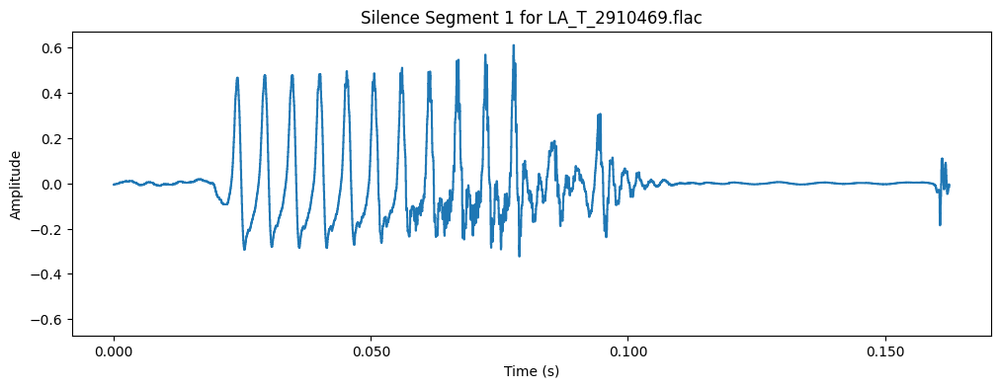

Playing silence segment 2 from LA_T_2910469.flac


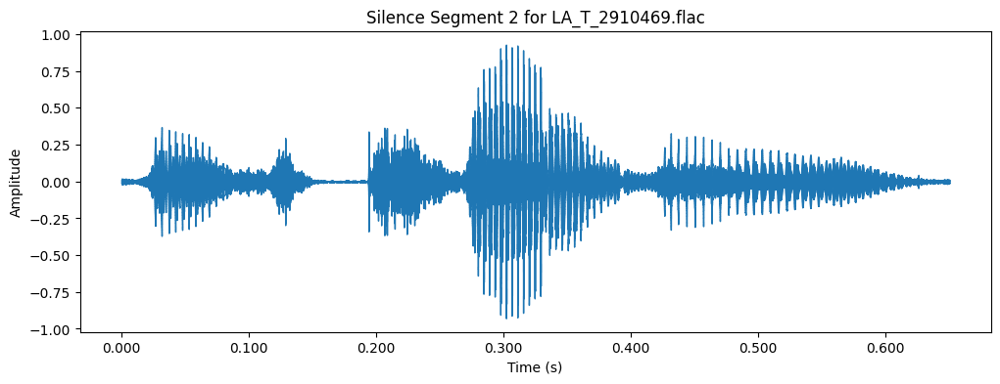

Playing silence segment 3 from LA_T_2910469.flac


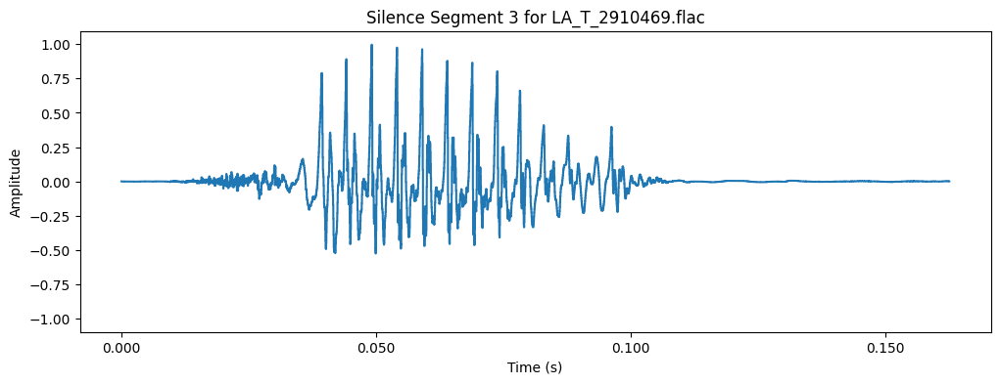

Playing silence segment 4 from LA_T_2910469.flac


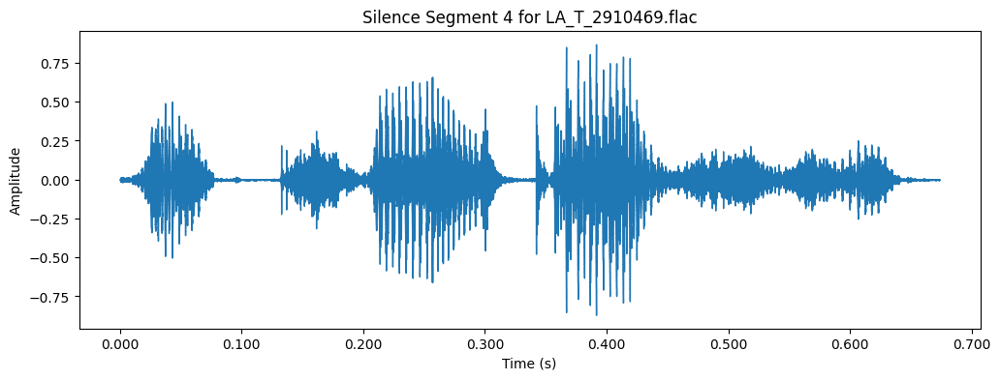

Playing silence segment 5 from LA_T_2910469.flac


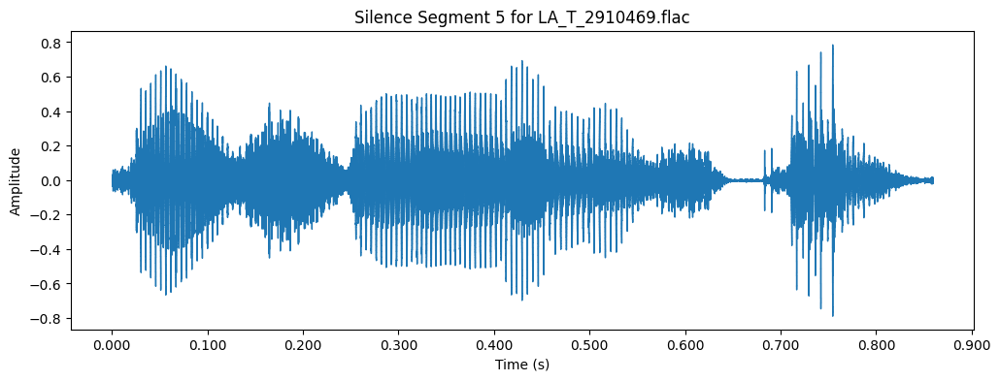

Playing silence segment 6 from LA_T_2910469.flac


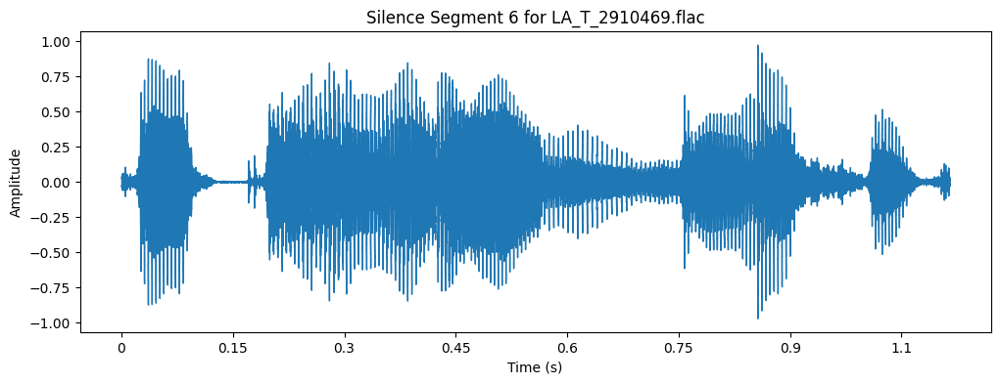

Playing silence segment 7 from LA_T_2910469.flac


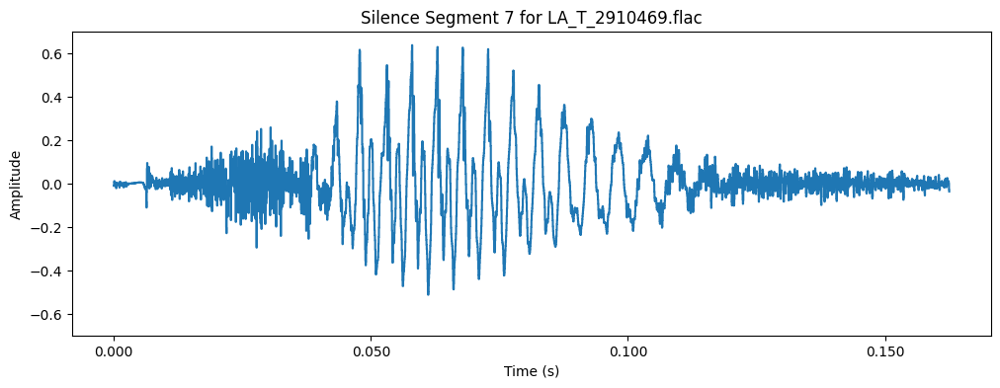

Playing silence segment 8 from LA_T_2910469.flac


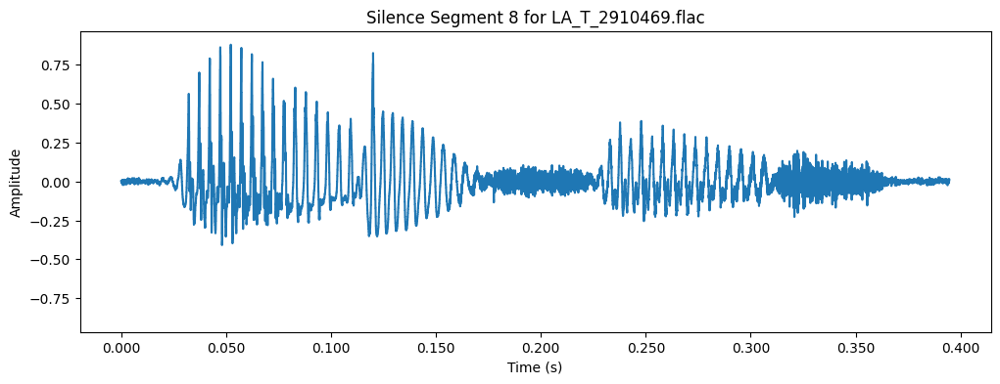

Playing silence segment 9 from LA_T_2910469.flac


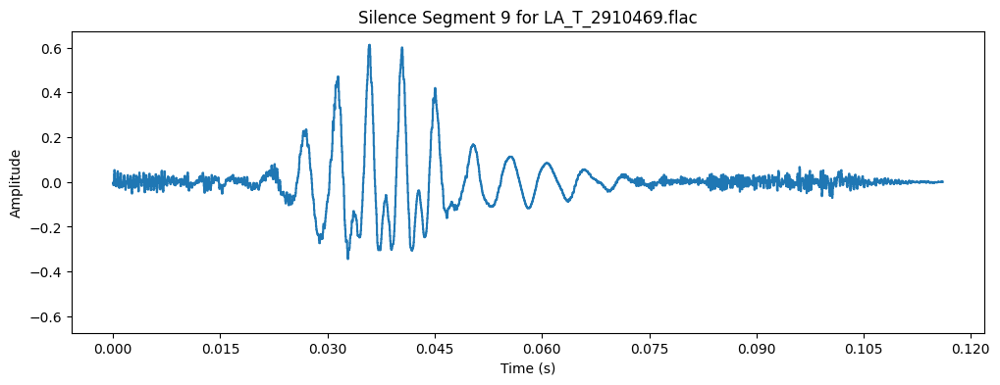

Playing silence segment 10 from LA_T_2910469.flac


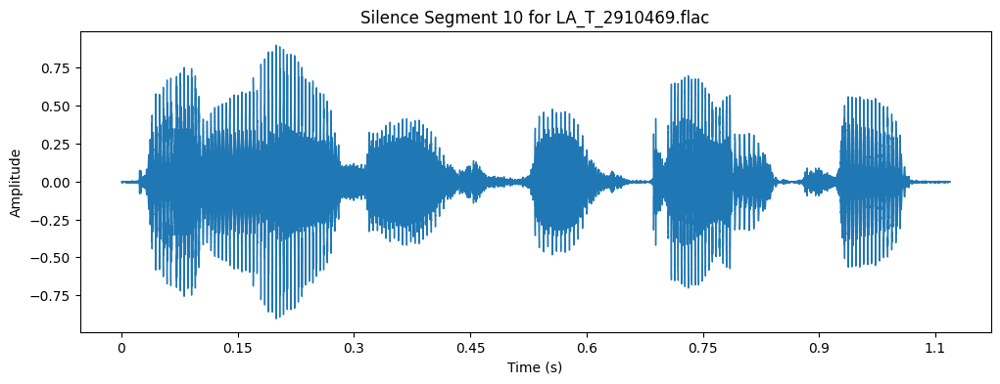

Playing silence segment 11 from LA_T_2910469.flac


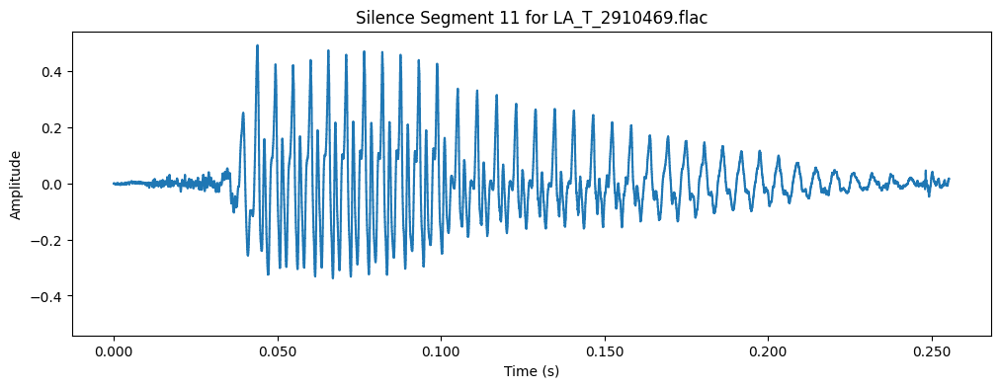

Playing silence segment 1 from LA_T_2903989.flac


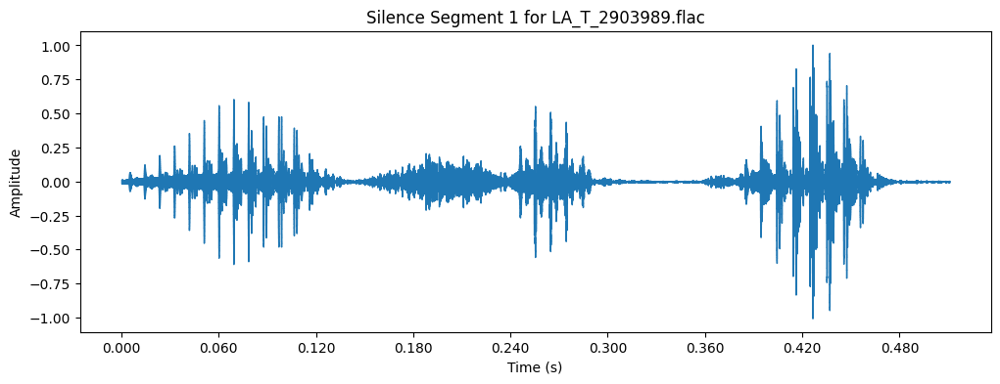

Playing silence segment 2 from LA_T_2903989.flac


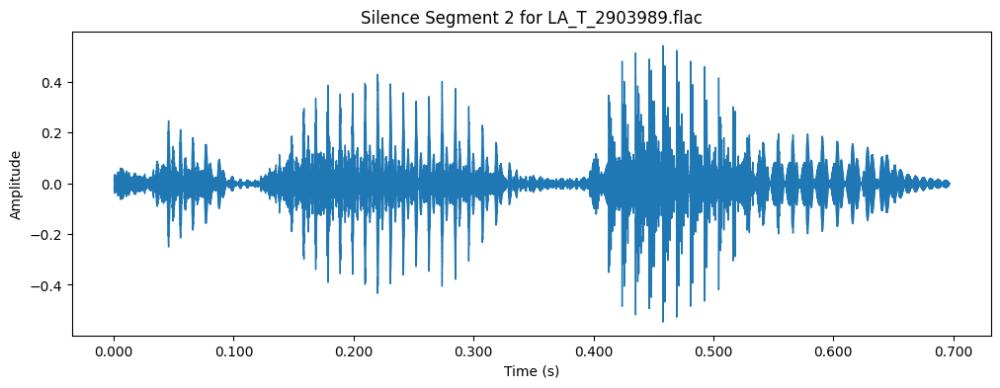

Playing silence segment 3 from LA_T_2903989.flac


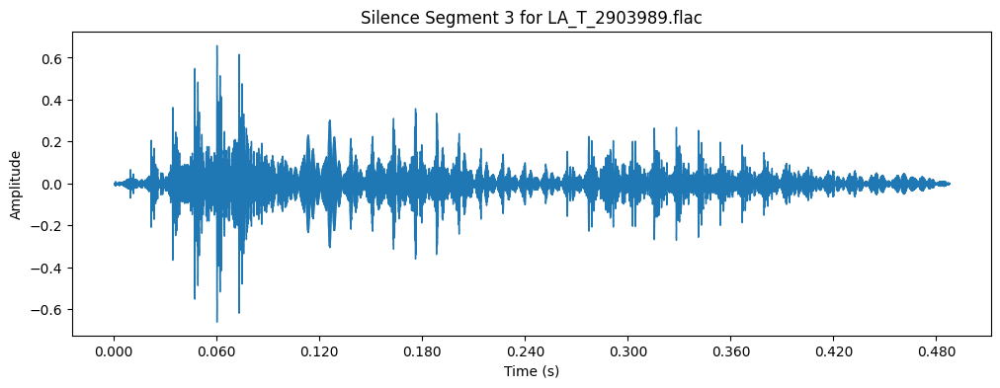

Playing silence segment 1 from LA_T_2911374.flac


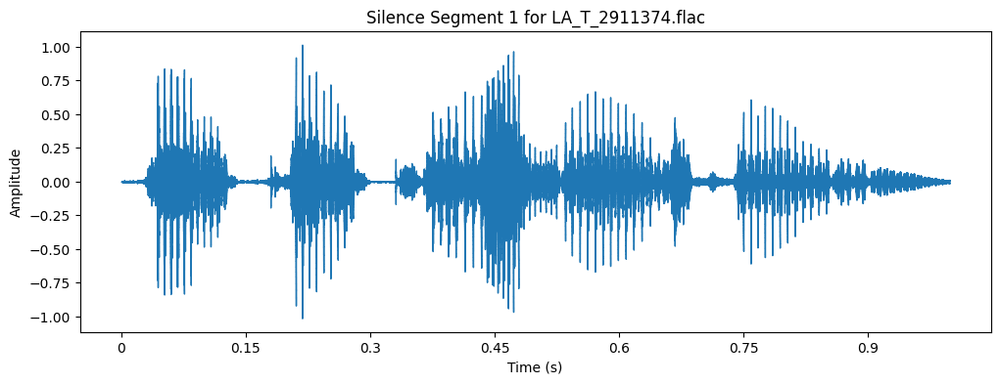

Playing silence segment 1 from LA_T_2905620.flac


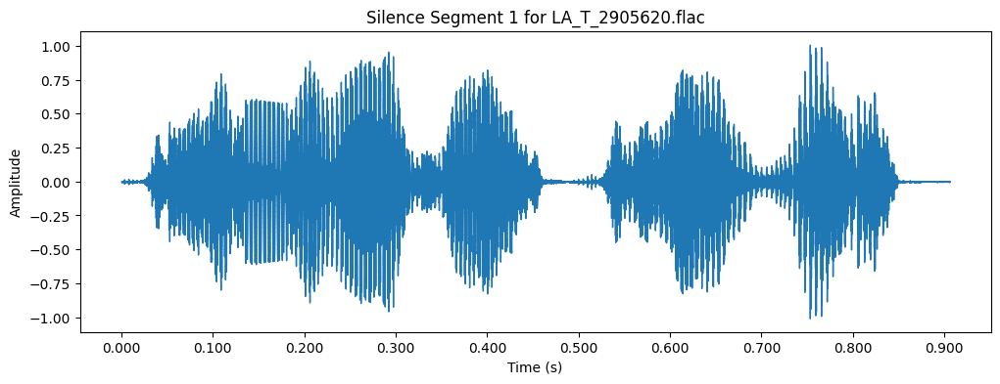

Playing silence segment 2 from LA_T_2905620.flac


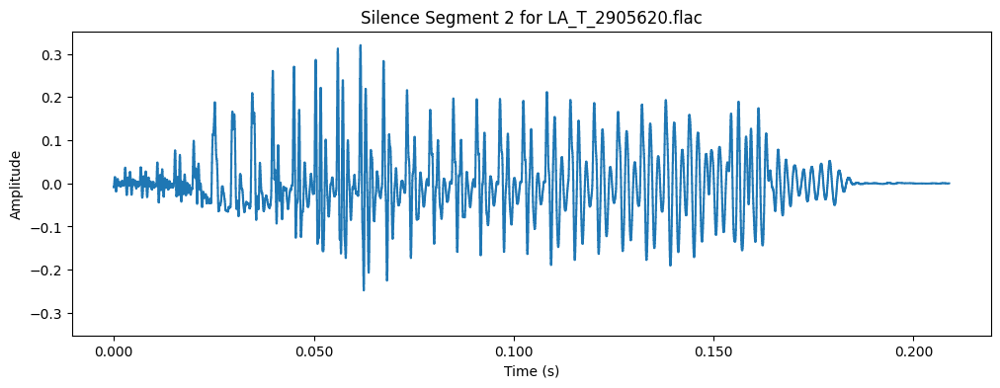

Playing silence segment 1 from LA_T_2904574.flac


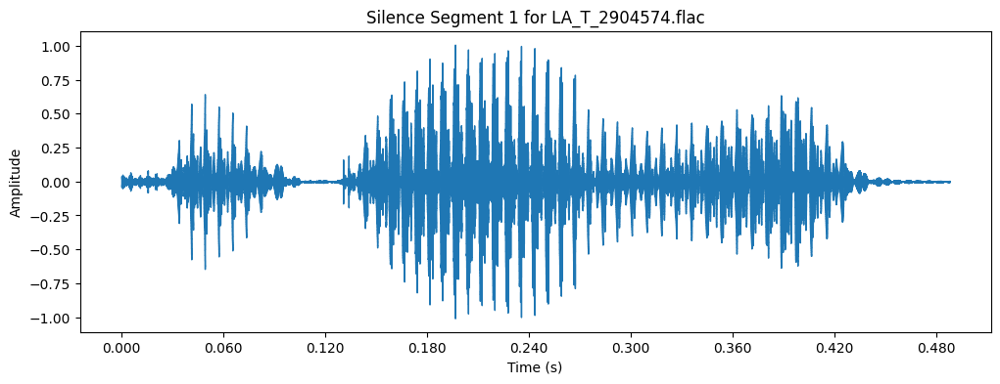

Playing silence segment 2 from LA_T_2904574.flac


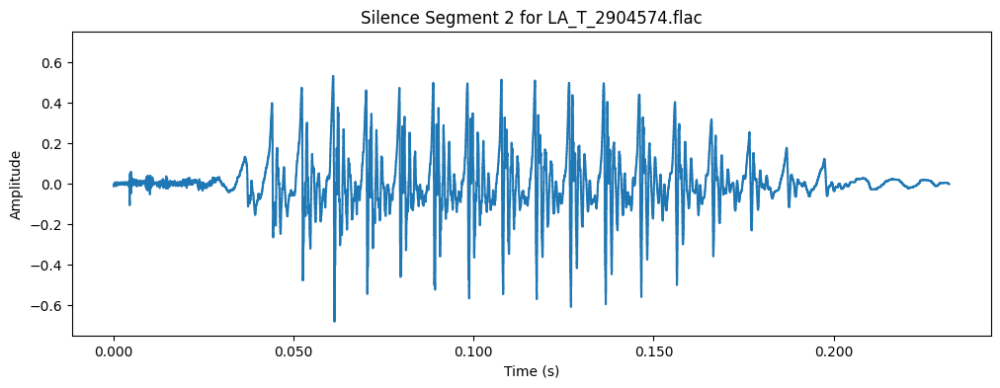

Playing silence segment 1 from LA_T_2912834.flac


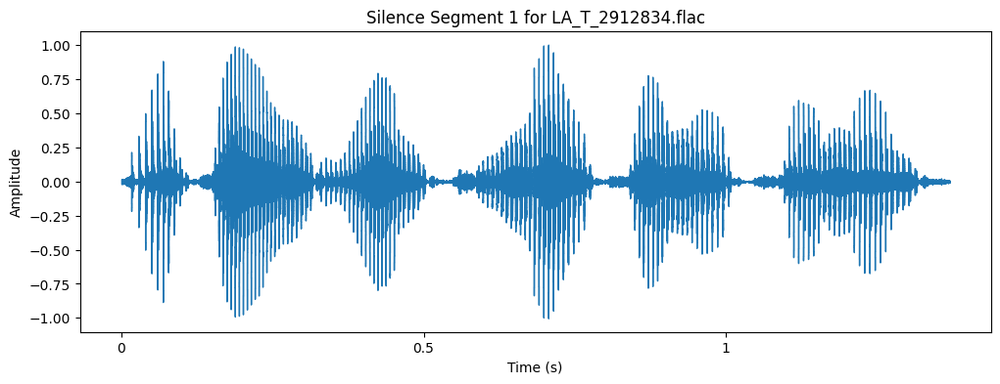

Playing silence segment 2 from LA_T_2912834.flac


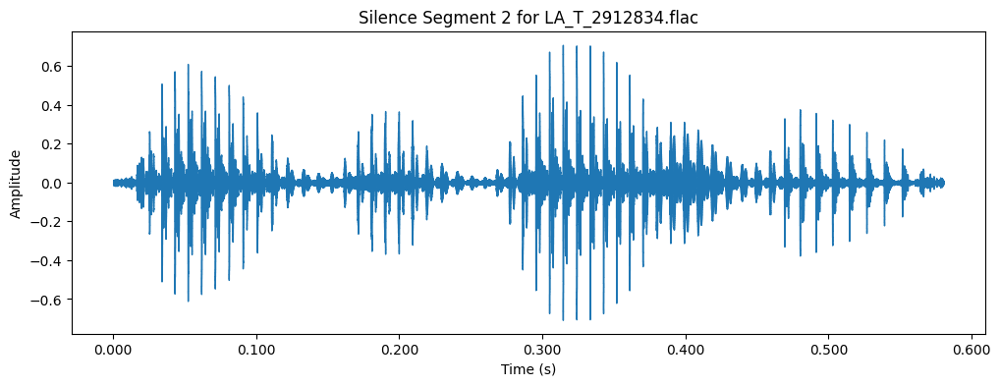

Playing silence segment 1 from LA_T_2909840.flac


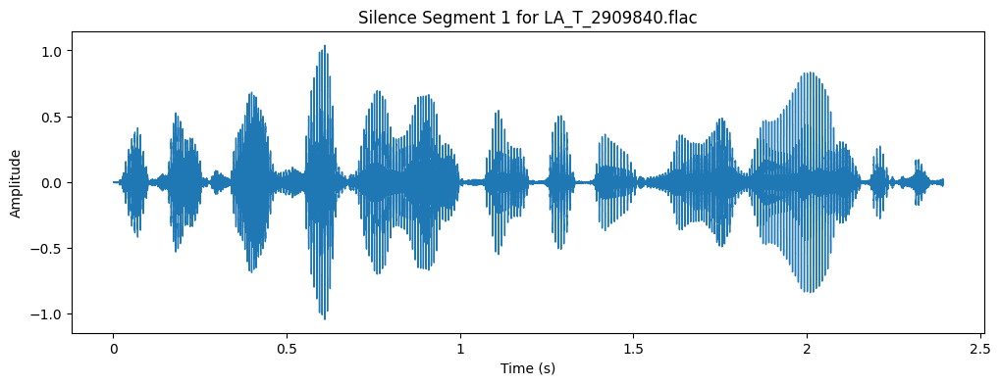

Playing silence segment 2 from LA_T_2909840.flac


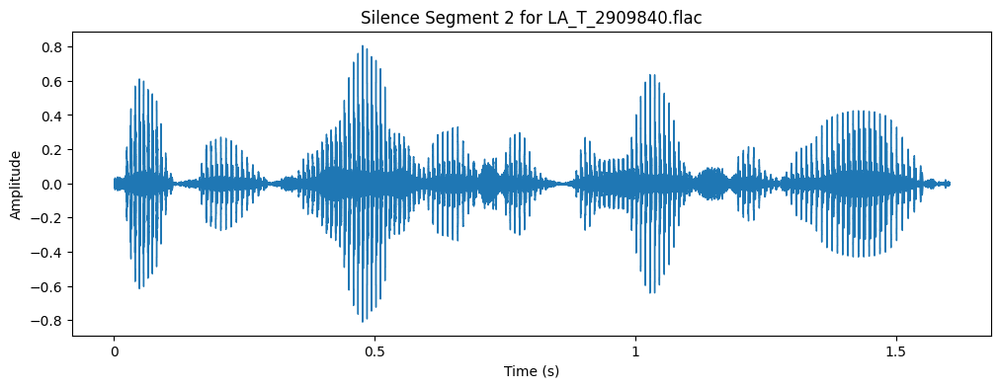

Playing silence segment 3 from LA_T_2909840.flac


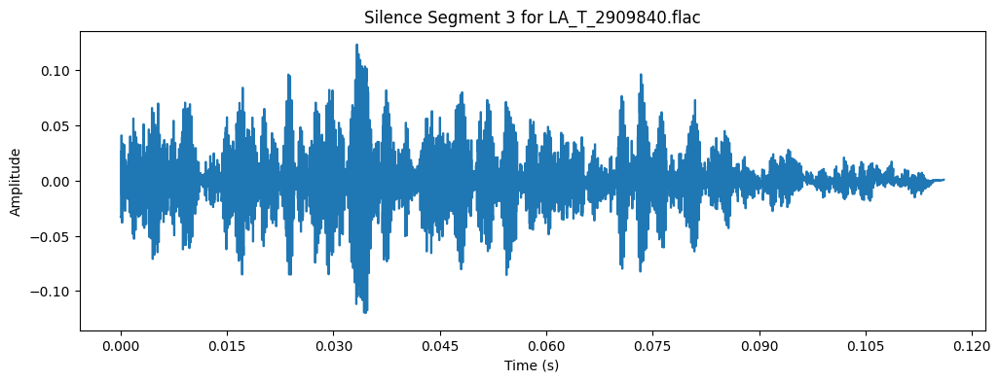

Playing silence segment 1 from LA_T_2906502.flac


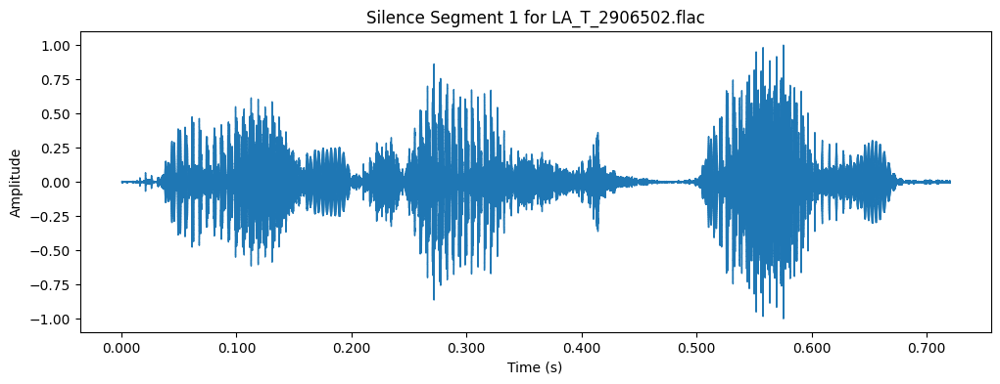

Playing silence segment 2 from LA_T_2906502.flac


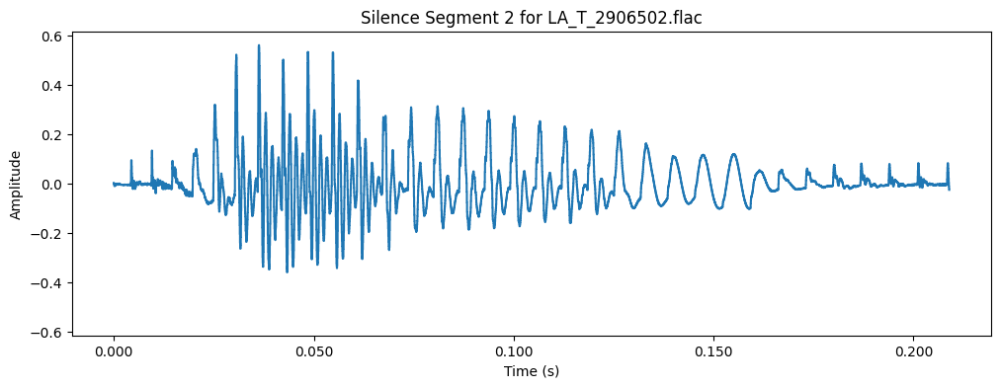

Playing silence segment 3 from LA_T_2906502.flac


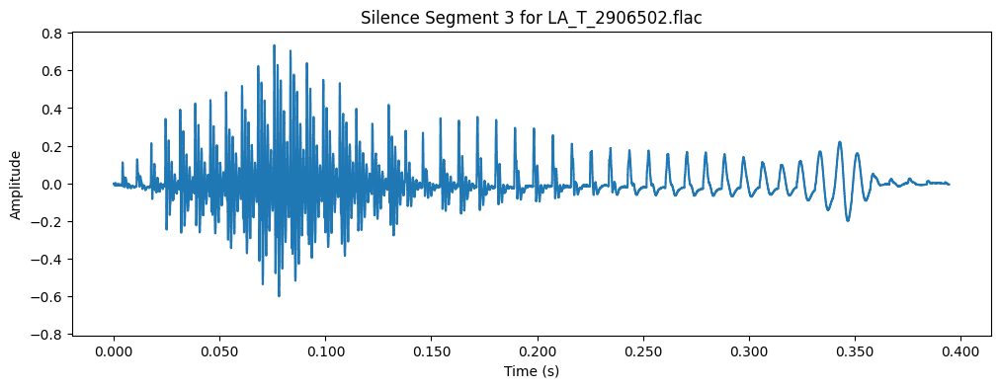

Playing silence segment 1 from LA_T_2906267.flac


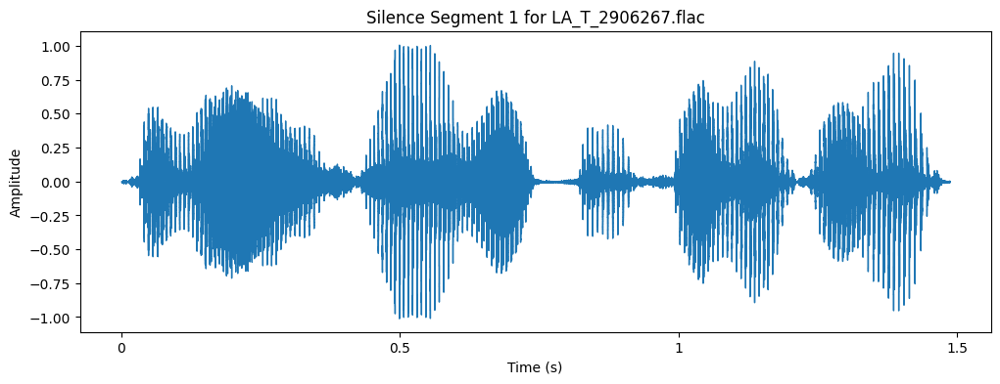

Playing silence segment 2 from LA_T_2906267.flac


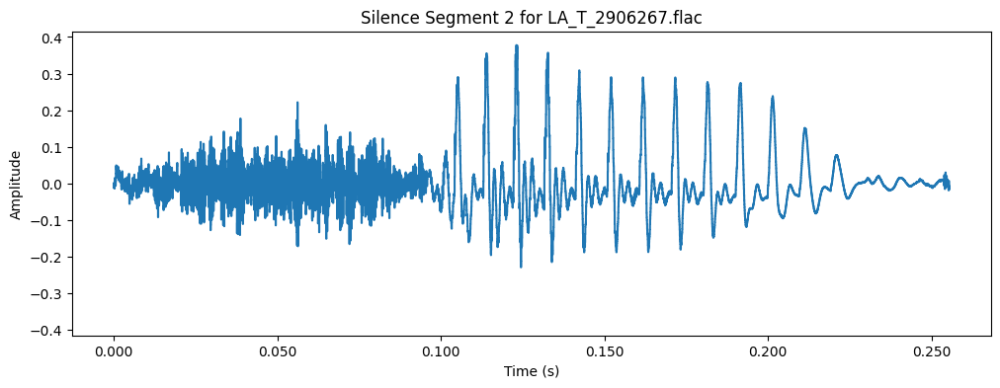

Playing silence segment 3 from LA_T_2906267.flac


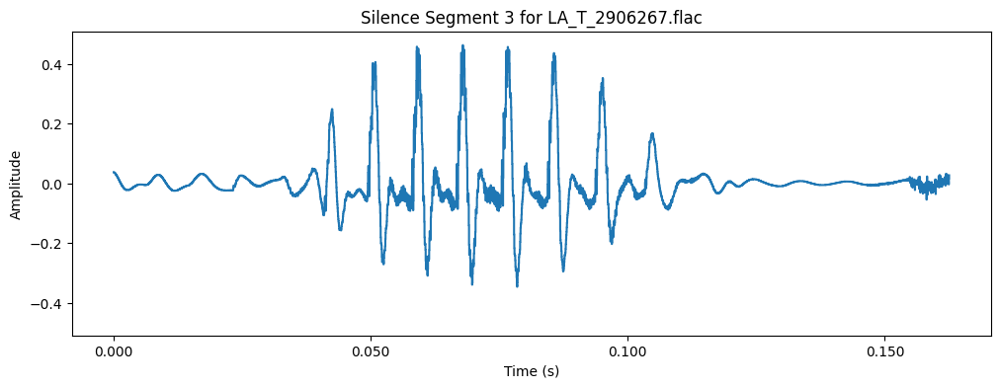

Playing silence segment 4 from LA_T_2906267.flac


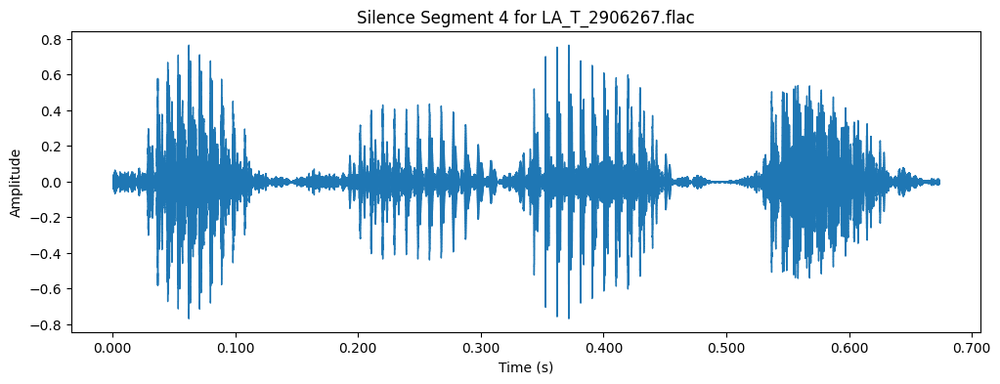

Playing silence segment 5 from LA_T_2906267.flac


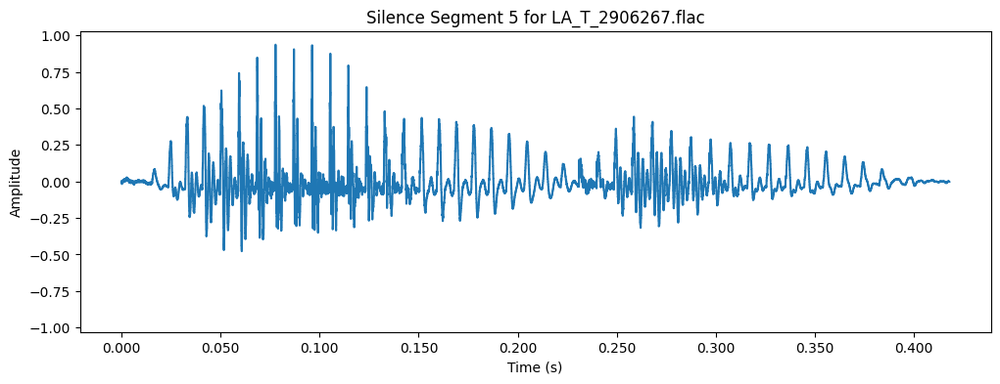

Playing silence segment 6 from LA_T_2906267.flac


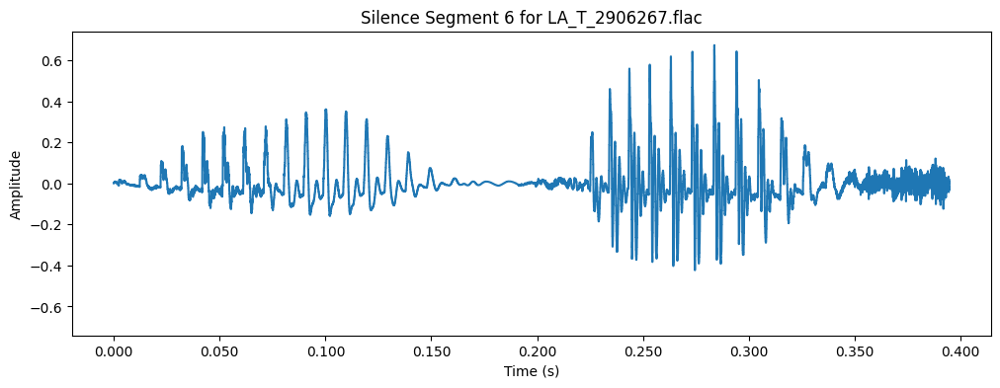

Playing silence segment 7 from LA_T_2906267.flac


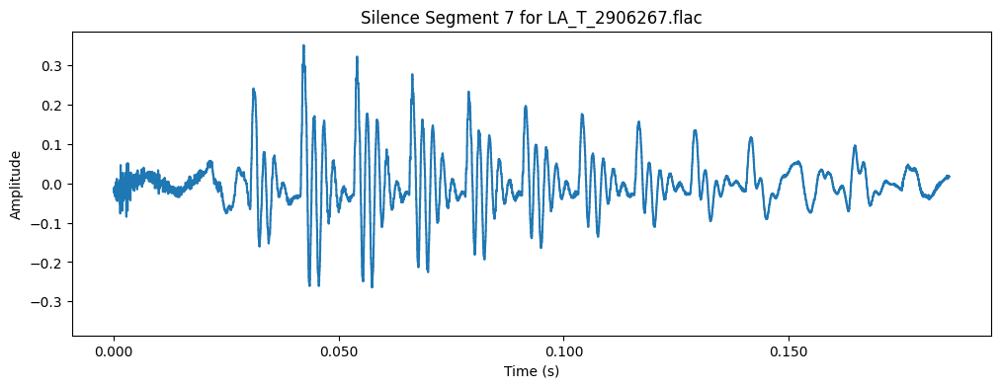

Playing silence segment 1 from LA_T_2907139.flac


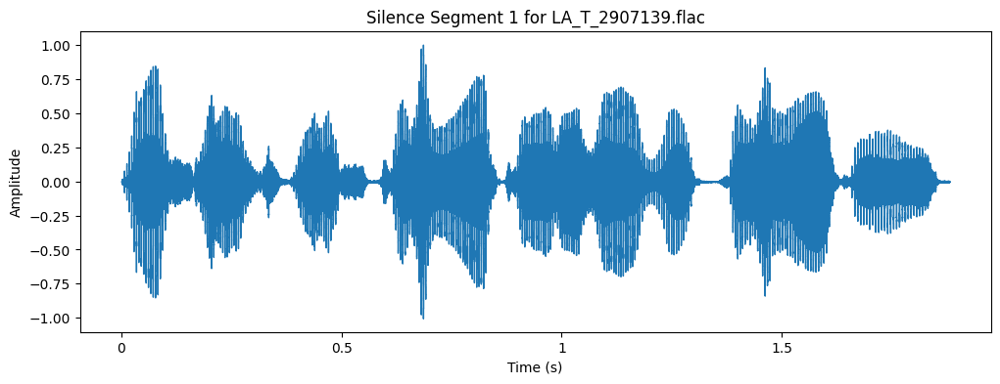

Playing silence segment 1 from LA_T_2911645.flac


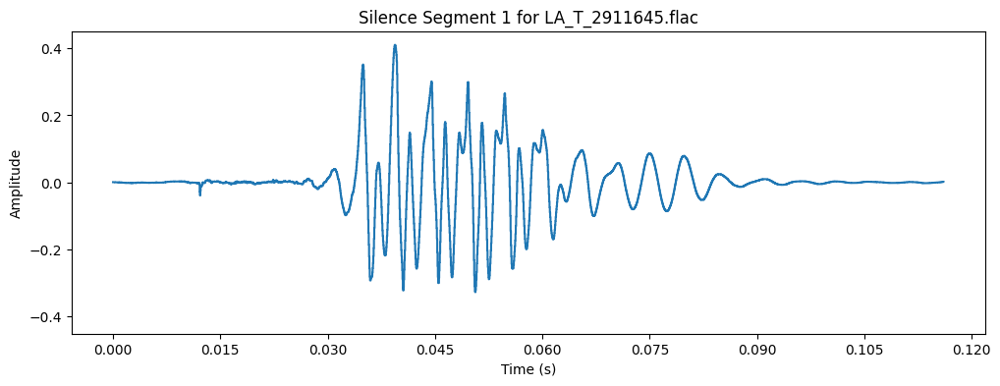

Playing silence segment 2 from LA_T_2911645.flac


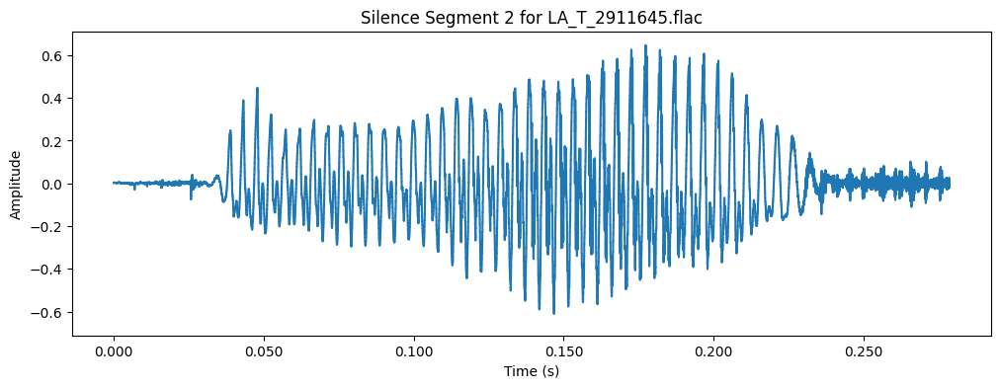

Playing silence segment 3 from LA_T_2911645.flac


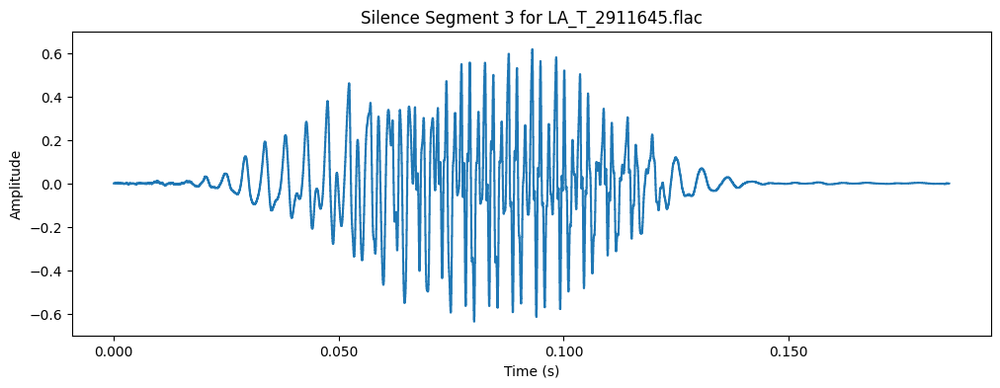

Playing silence segment 4 from LA_T_2911645.flac


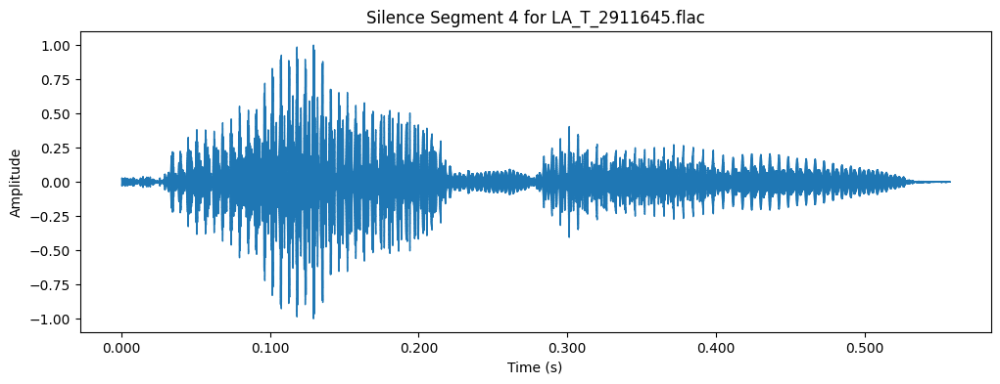

Playing silence segment 1 from LA_T_2909089.flac


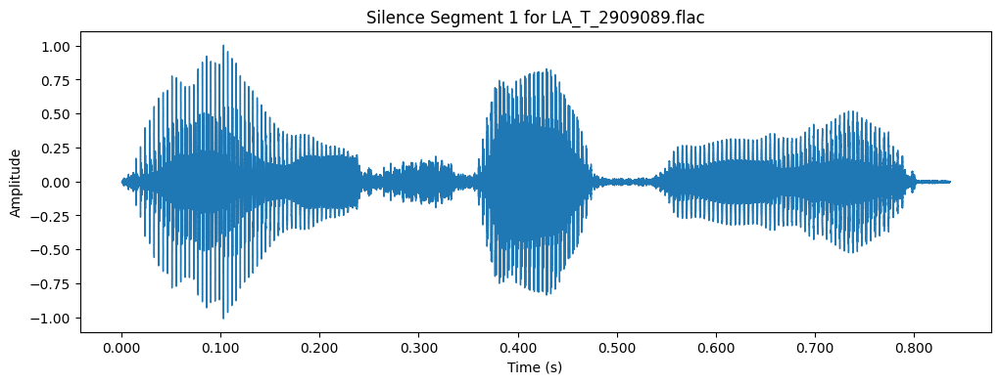

Playing silence segment 2 from LA_T_2909089.flac


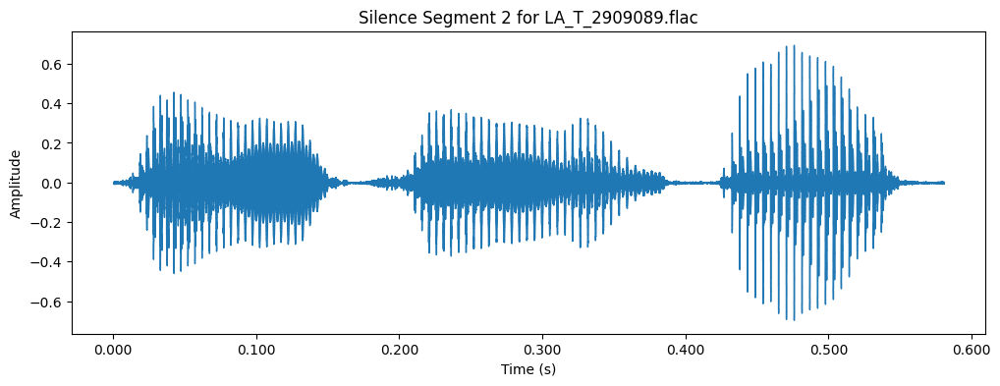

Playing silence segment 3 from LA_T_2909089.flac


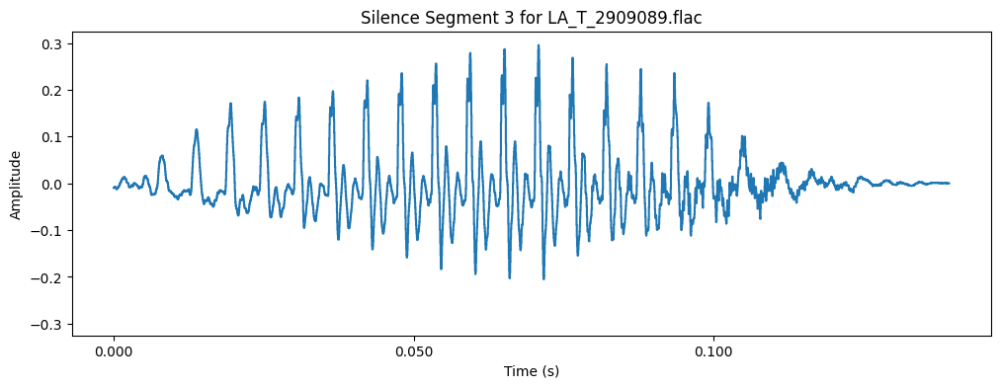

Playing silence segment 4 from LA_T_2909089.flac


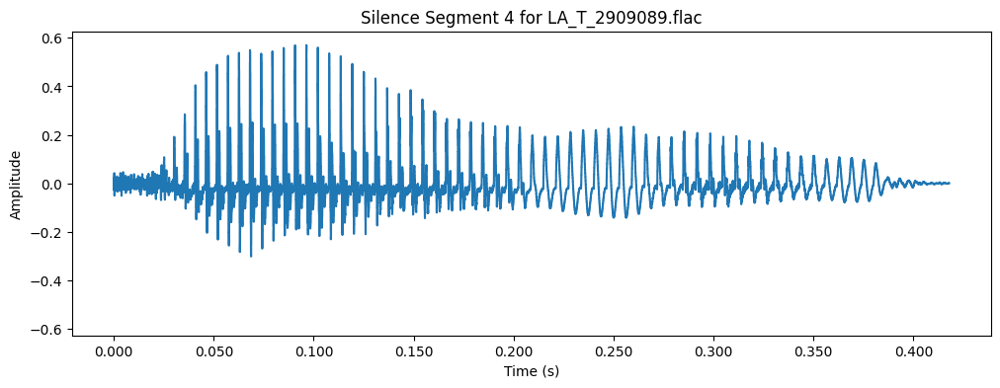

Playing silence segment 1 from LA_T_2909480.flac


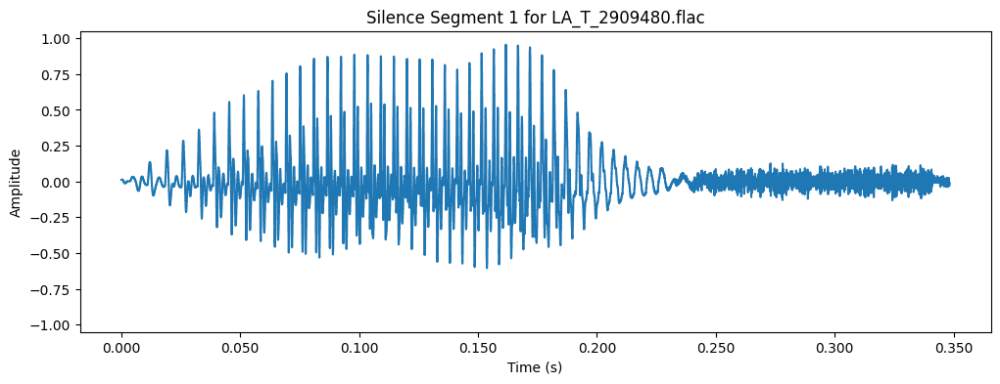

Playing silence segment 2 from LA_T_2909480.flac


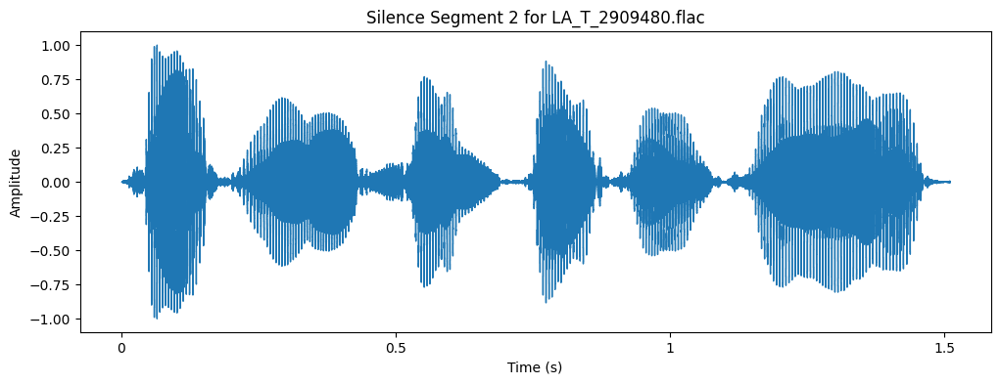

Playing silence segment 3 from LA_T_2909480.flac


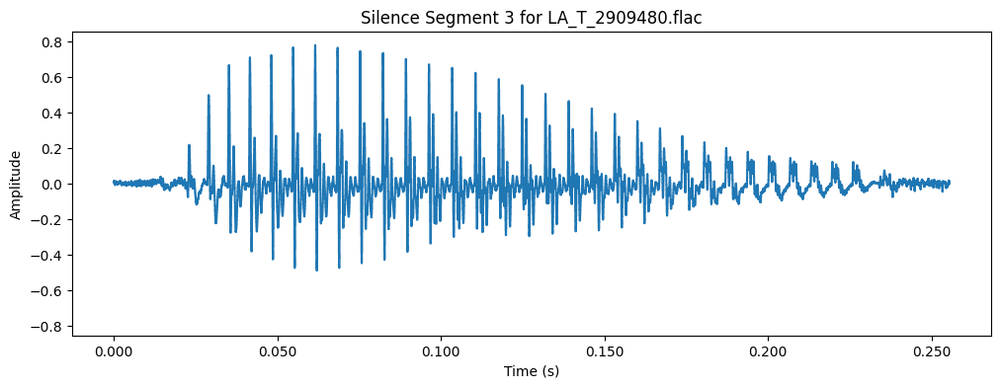

Playing silence segment 1 from LA_T_2910120.flac


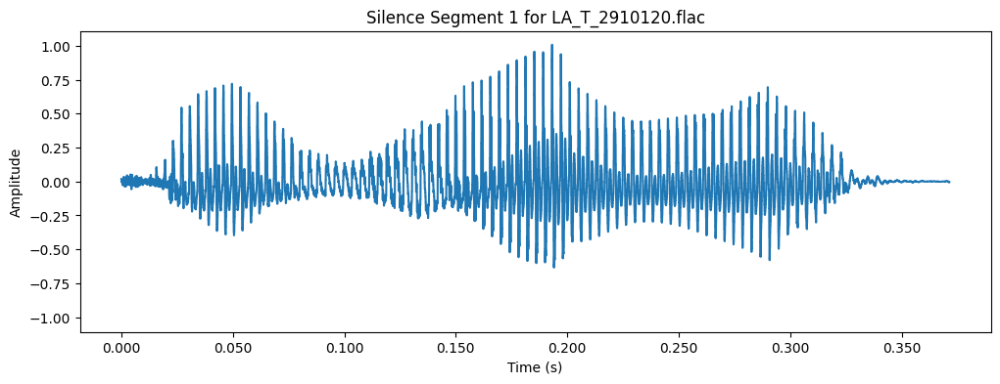

Playing silence segment 2 from LA_T_2910120.flac


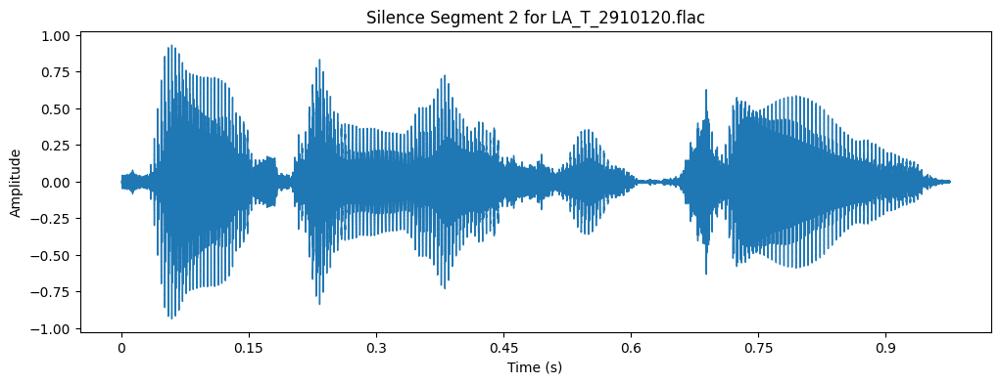

Playing silence segment 1 from LA_T_2904734.flac


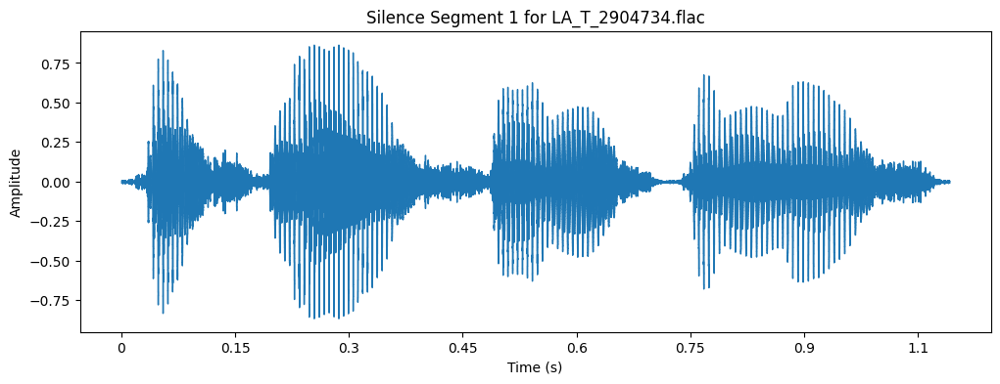

Playing silence segment 2 from LA_T_2904734.flac


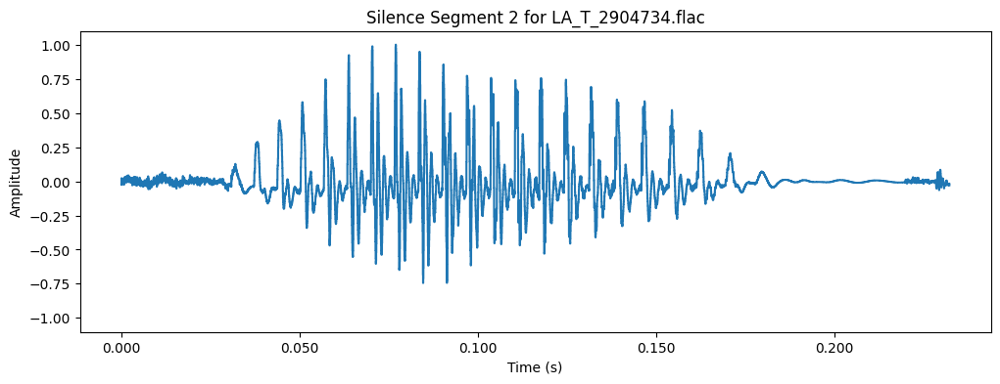

Playing silence segment 3 from LA_T_2904734.flac


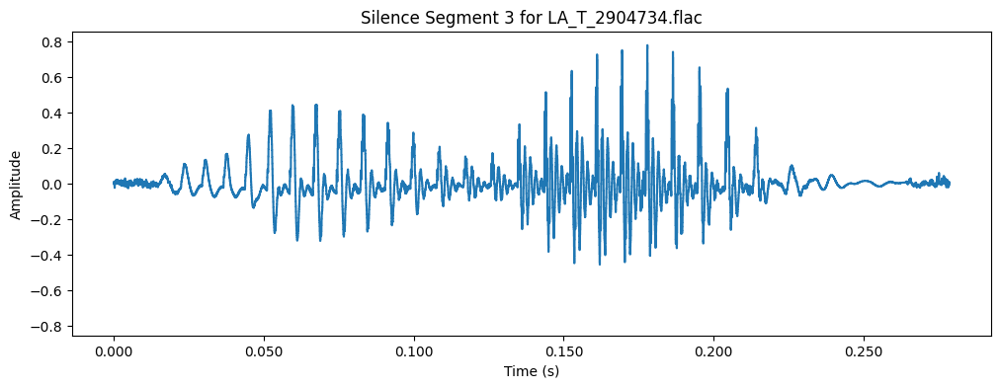

Playing silence segment 4 from LA_T_2904734.flac


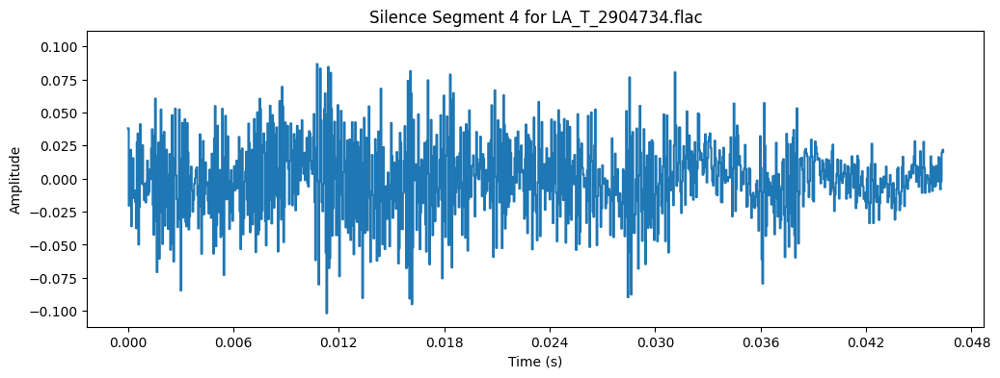

Playing silence segment 5 from LA_T_2904734.flac


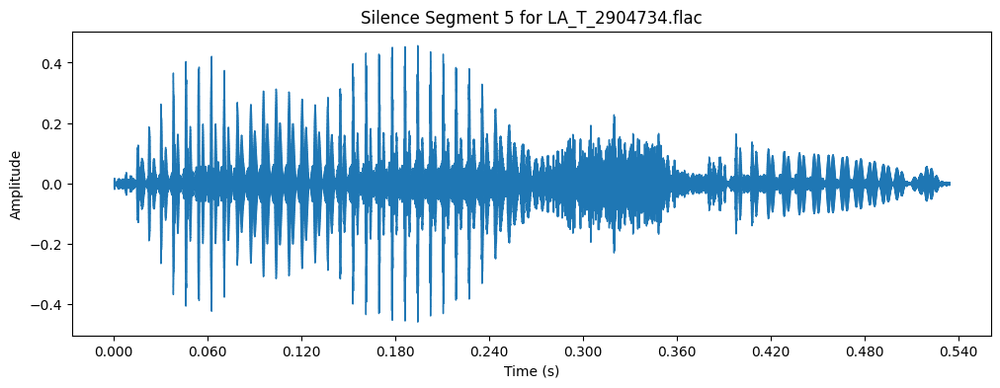

Playing silence segment 1 from LA_T_2911754.flac


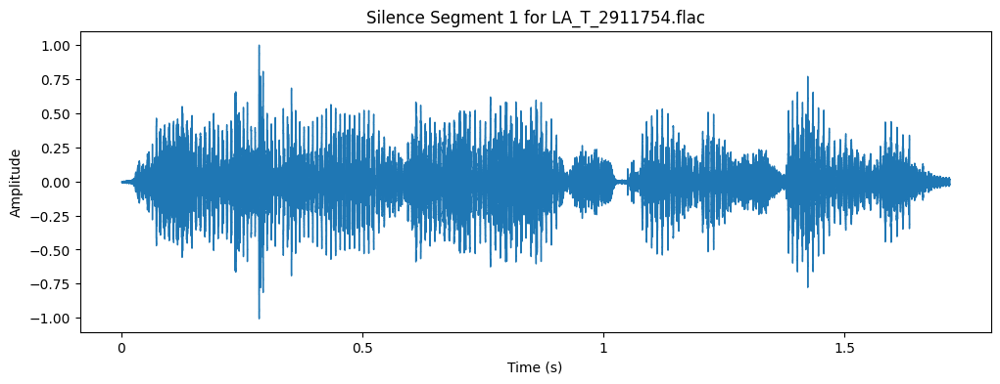

Playing silence segment 1 from LA_T_2906588.flac


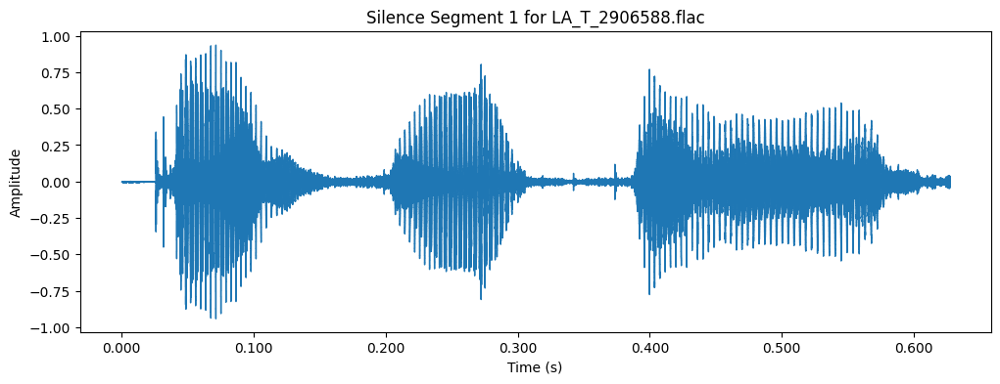

Playing silence segment 2 from LA_T_2906588.flac


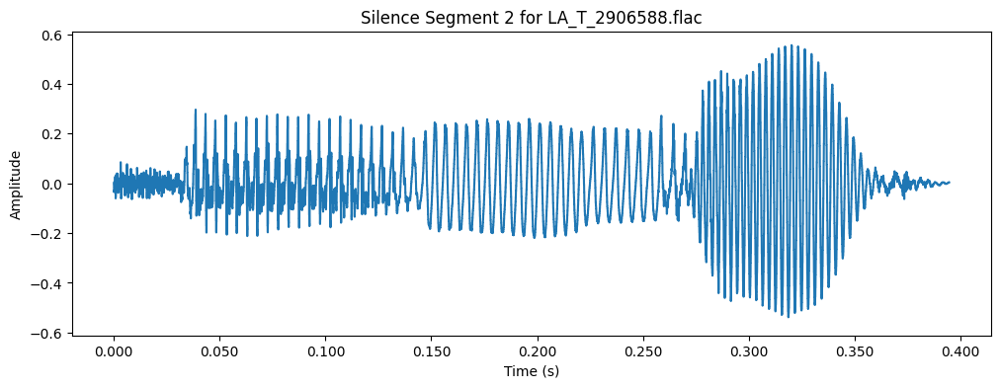

Playing silence segment 3 from LA_T_2906588.flac


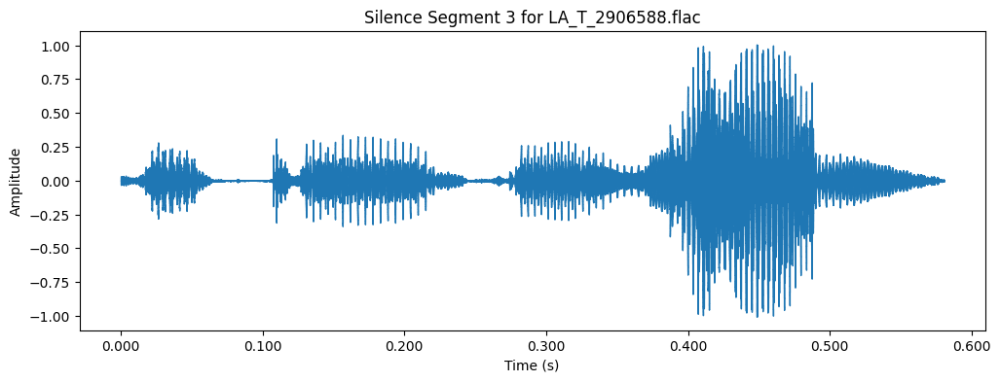

Playing silence segment 1 from LA_T_2905637.flac


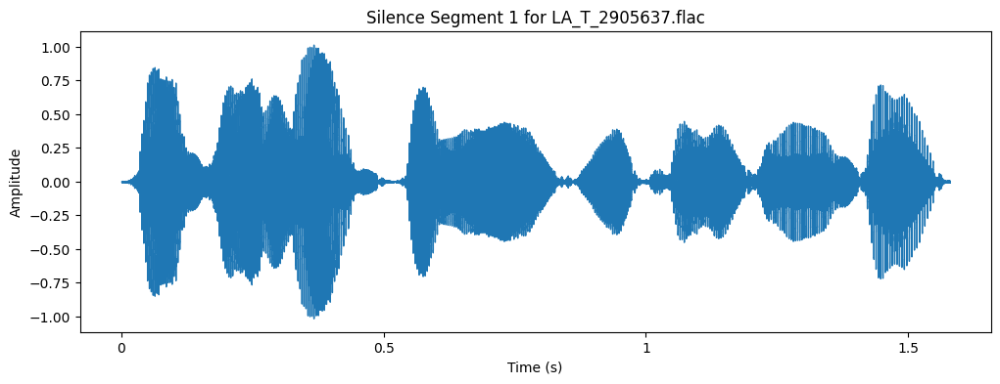

Playing silence segment 2 from LA_T_2905637.flac


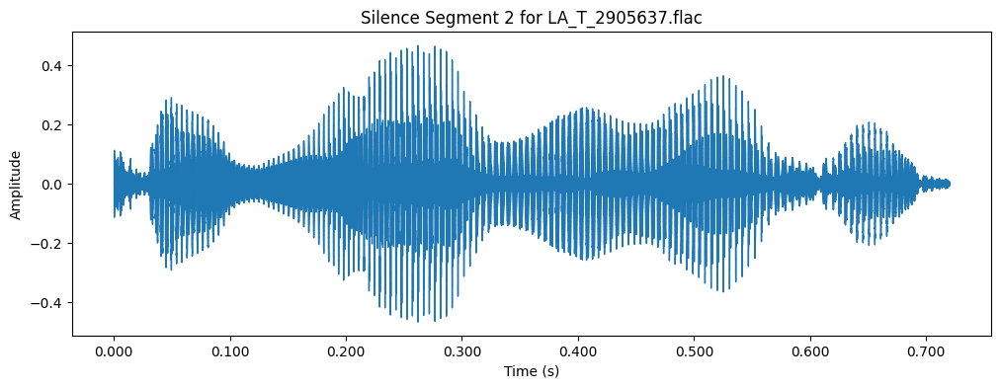

Playing silence segment 3 from LA_T_2905637.flac


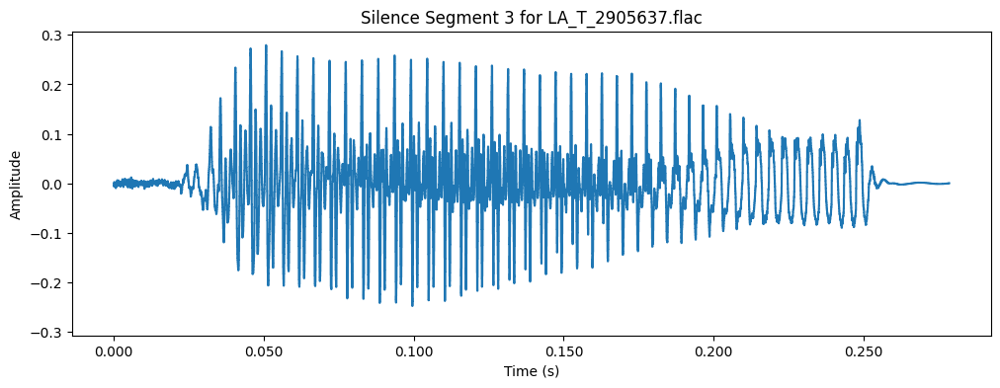

Playing silence segment 1 from LA_T_2911955.flac


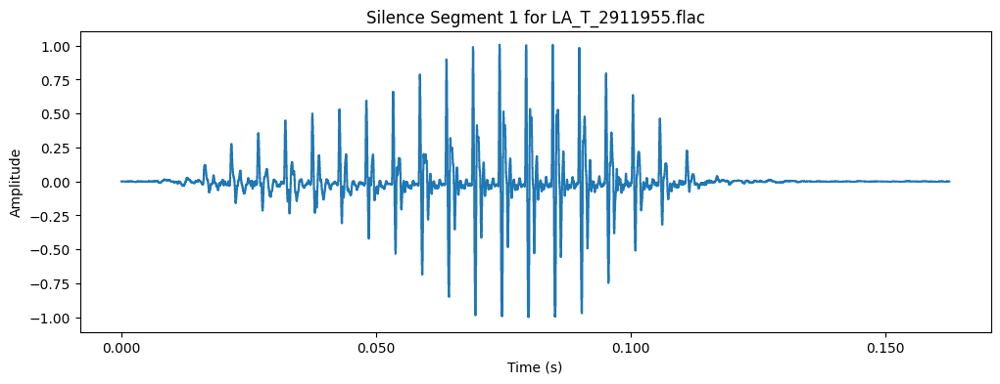

Playing silence segment 2 from LA_T_2911955.flac


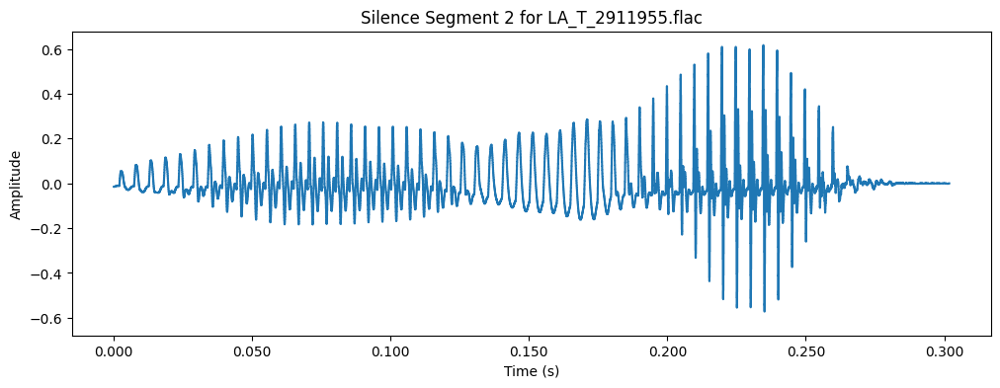

Playing silence segment 3 from LA_T_2911955.flac


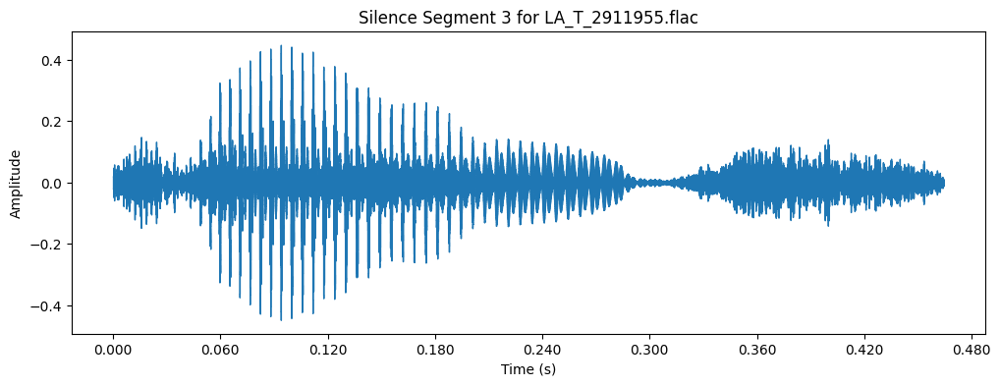

Playing silence segment 1 from LA_T_2903988.flac


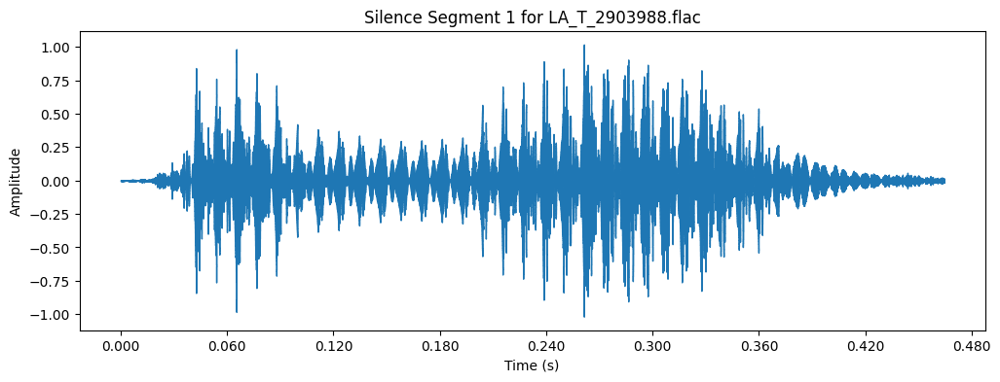

Playing silence segment 2 from LA_T_2903988.flac


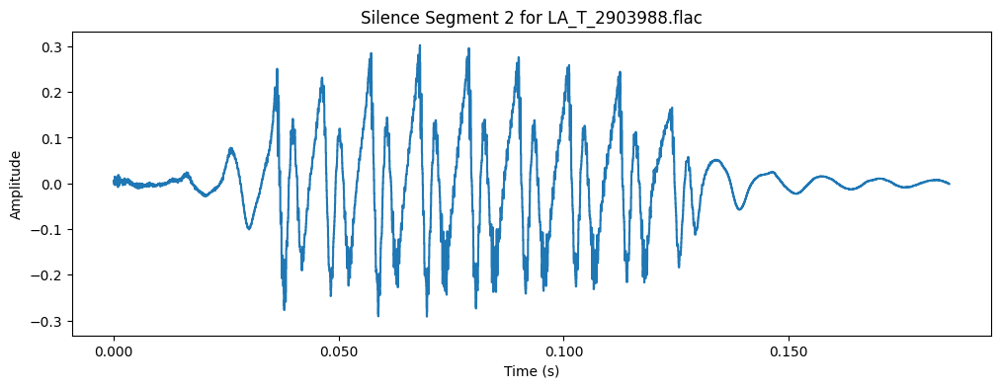

Playing silence segment 3 from LA_T_2903988.flac


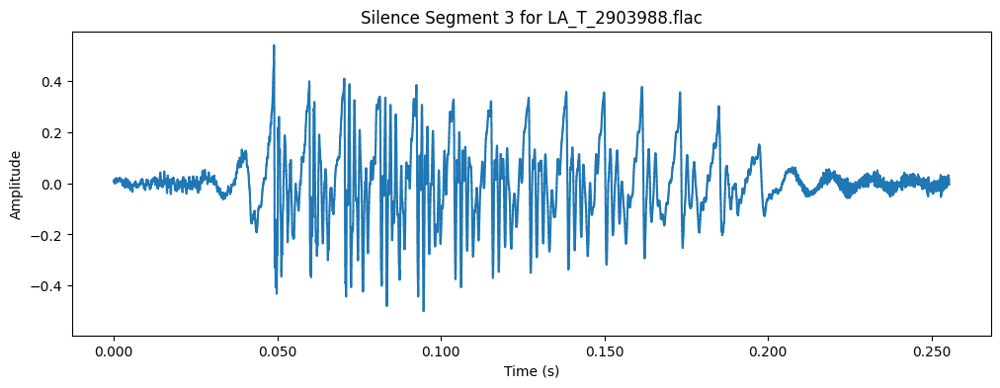

Playing silence segment 4 from LA_T_2903988.flac


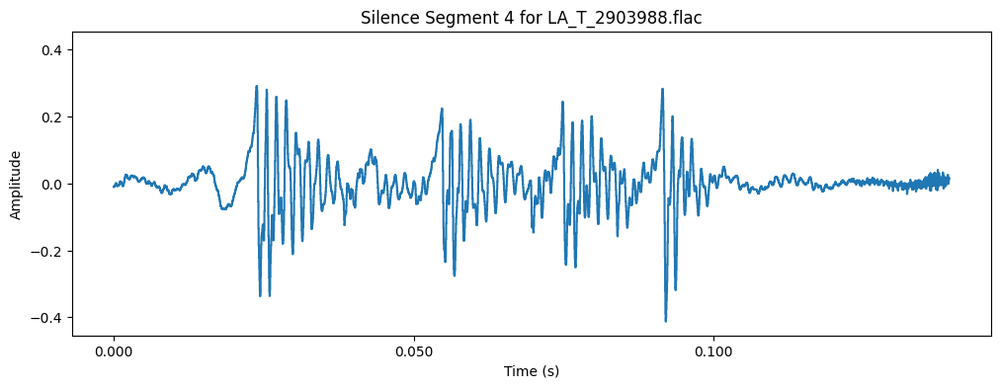

Playing silence segment 1 from LA_T_2904833.flac


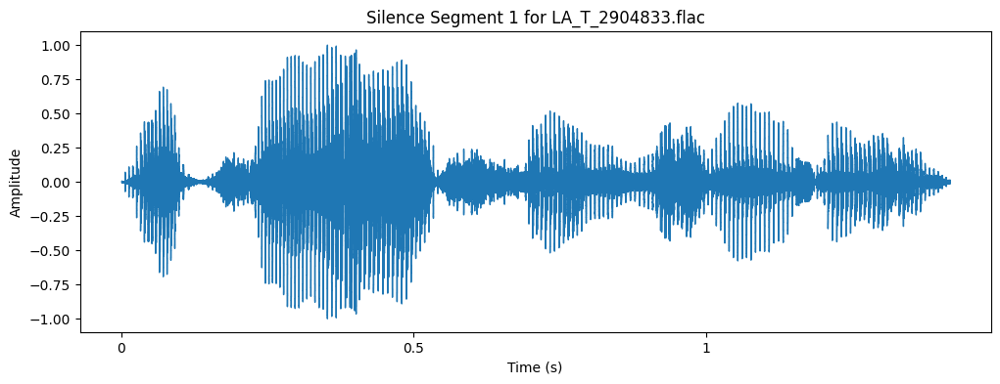

Playing silence segment 1 from LA_T_2906712.flac


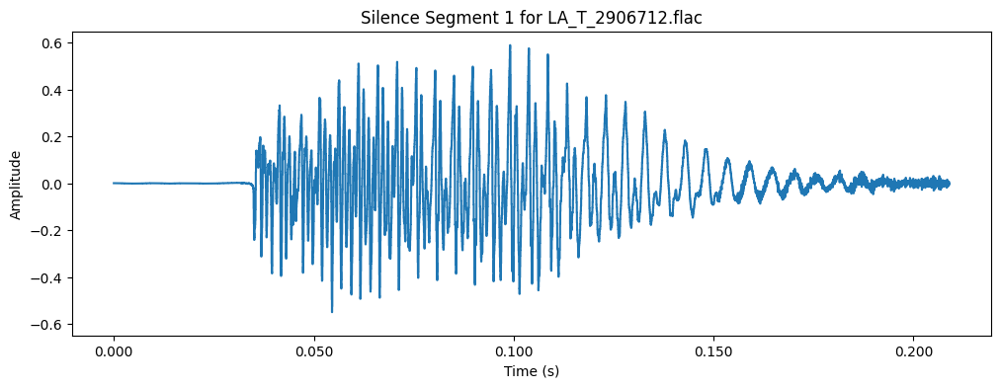

Playing silence segment 2 from LA_T_2906712.flac


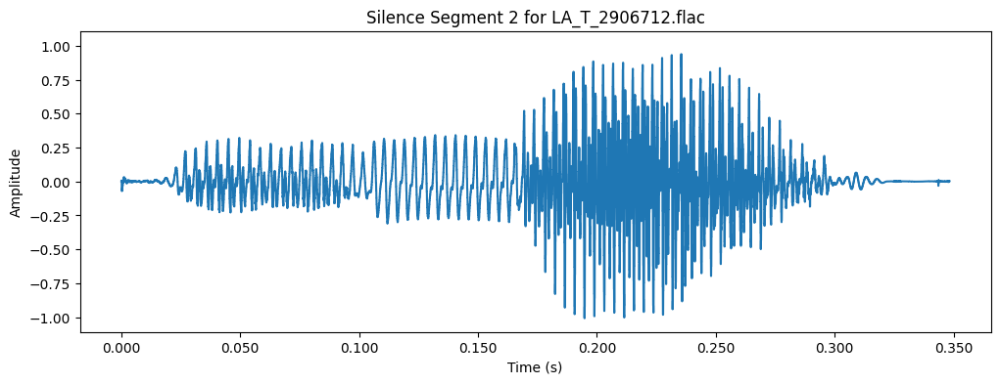

Playing silence segment 1 from LA_T_2906660.flac


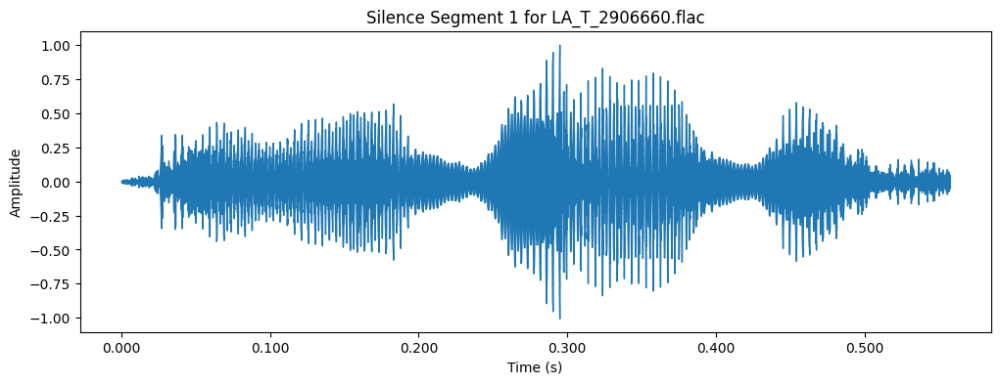

Playing silence segment 2 from LA_T_2906660.flac


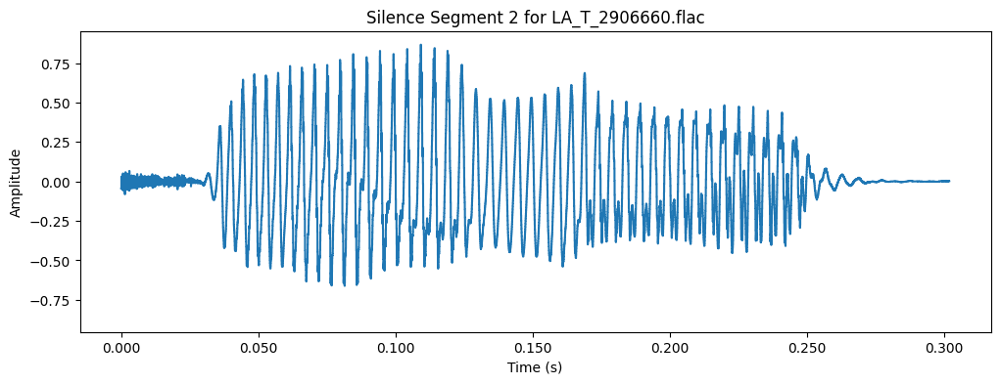

Playing silence segment 3 from LA_T_2906660.flac


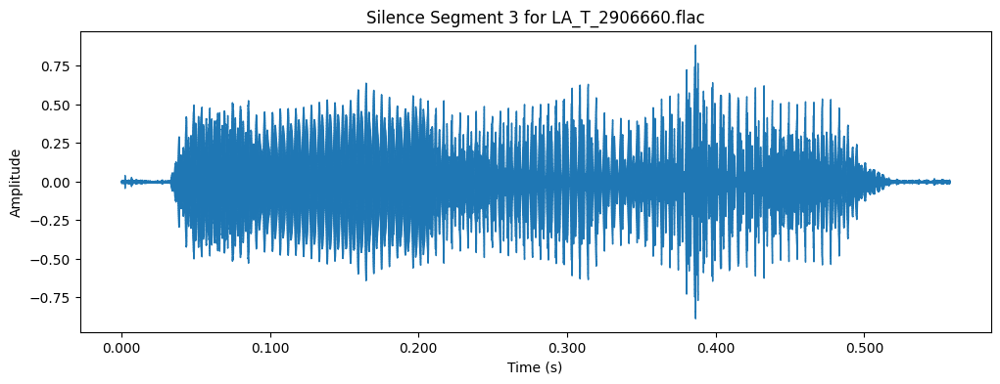

Playing silence segment 4 from LA_T_2906660.flac


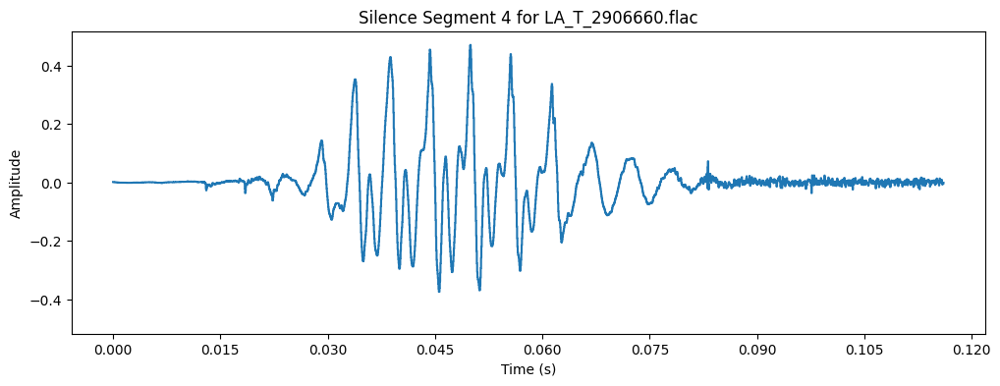

Playing silence segment 5 from LA_T_2906660.flac


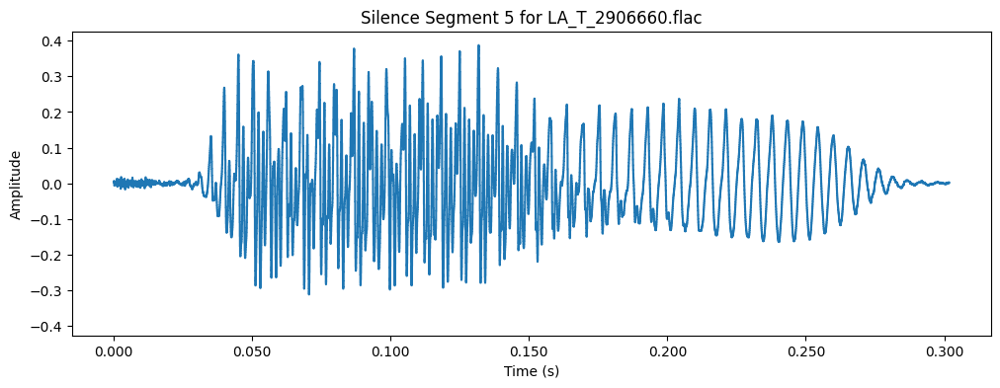

Playing silence segment 1 from LA_T_2905034.flac


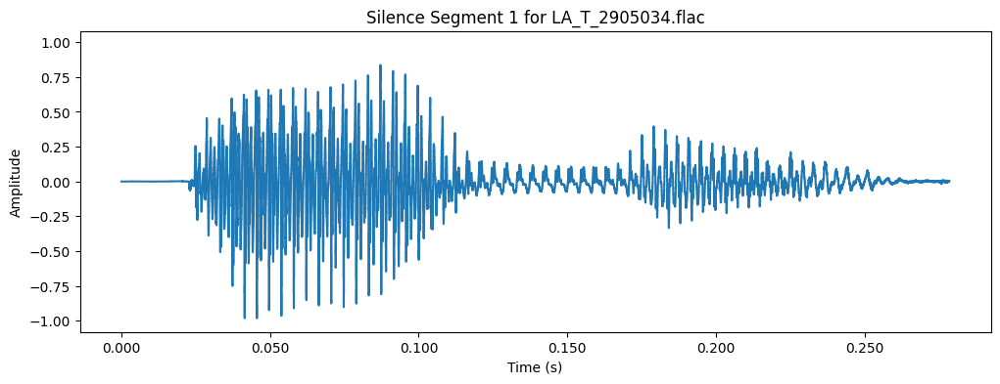

Playing silence segment 2 from LA_T_2905034.flac


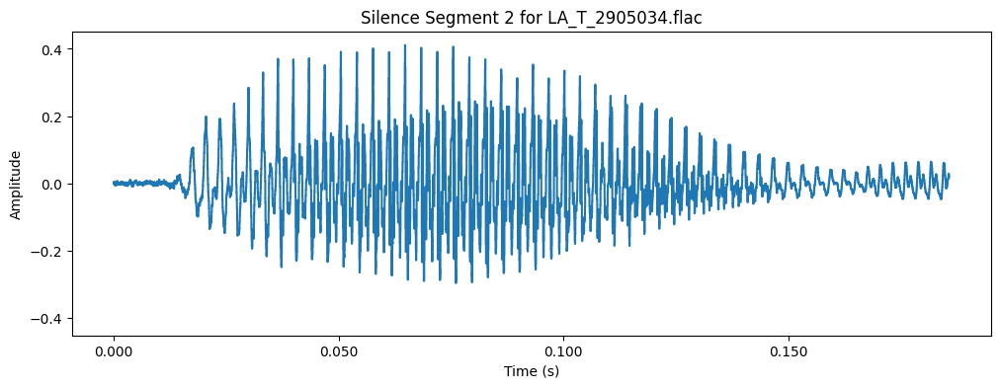

Playing silence segment 3 from LA_T_2905034.flac


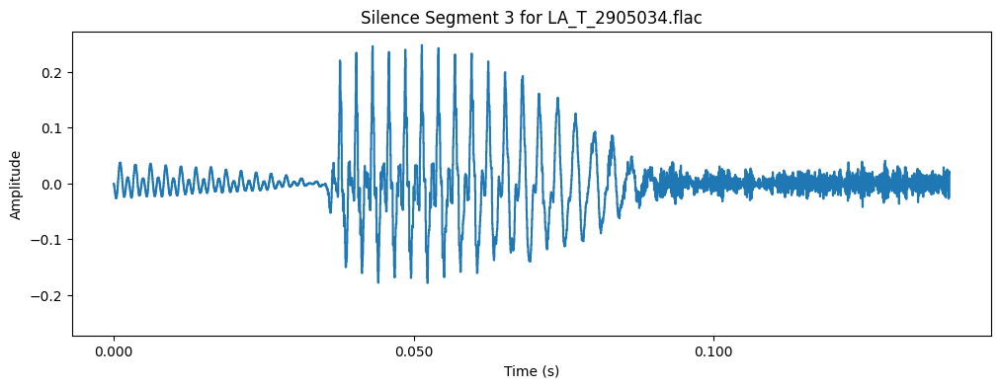

Playing silence segment 4 from LA_T_2905034.flac


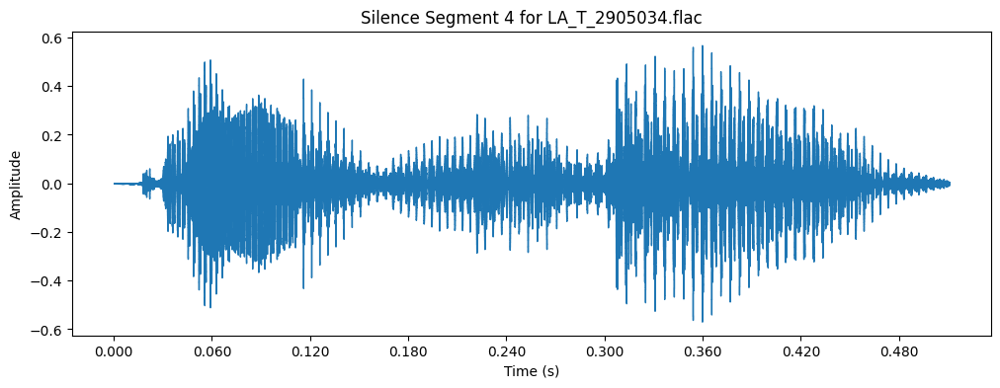

Playing silence segment 5 from LA_T_2905034.flac


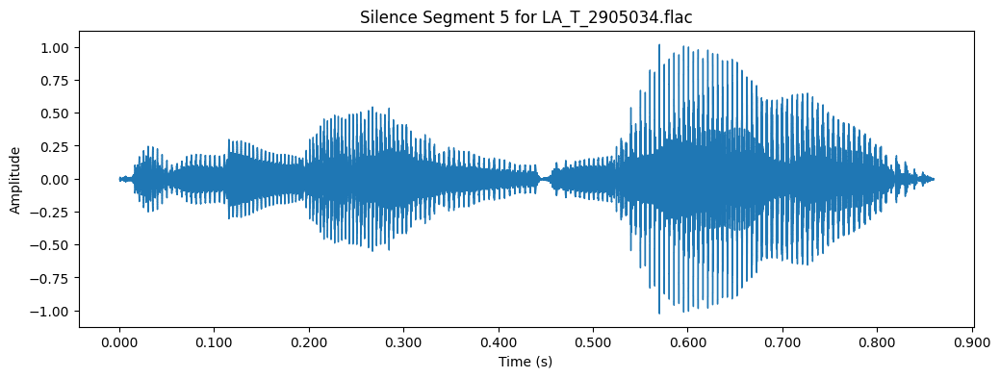

Playing silence segment 1 from LA_T_2911664.flac


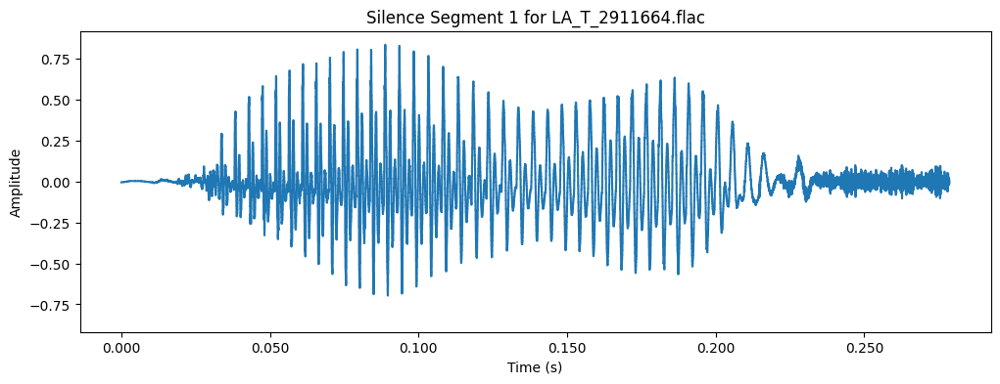

Playing silence segment 2 from LA_T_2911664.flac


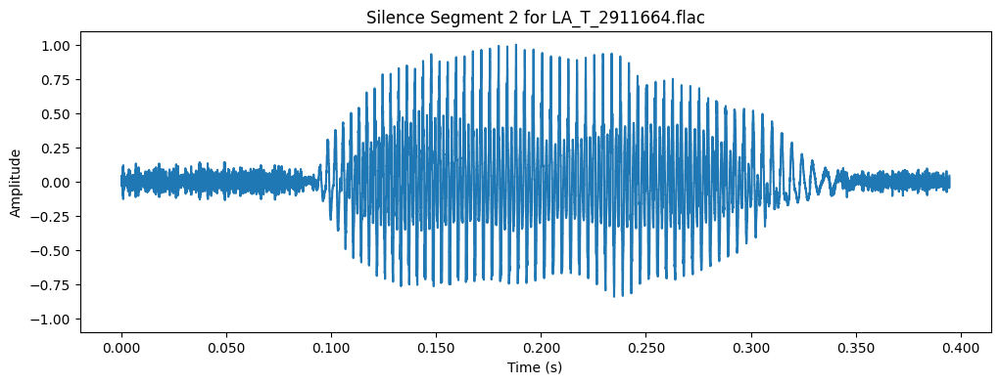

Playing silence segment 3 from LA_T_2911664.flac


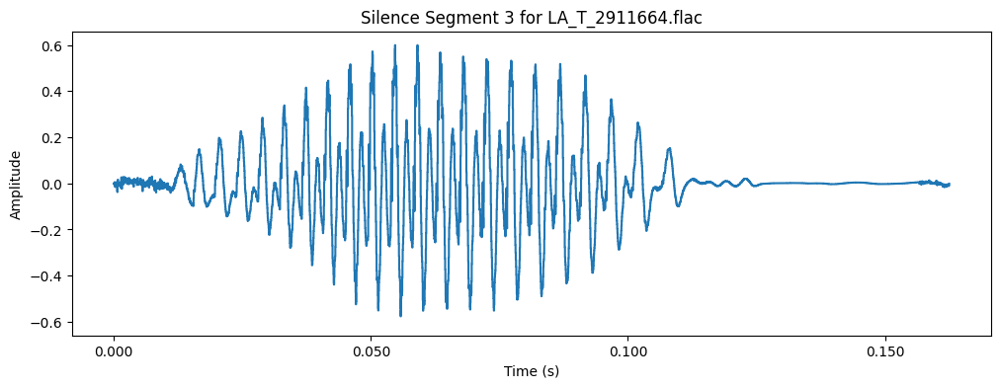

Playing silence segment 4 from LA_T_2911664.flac


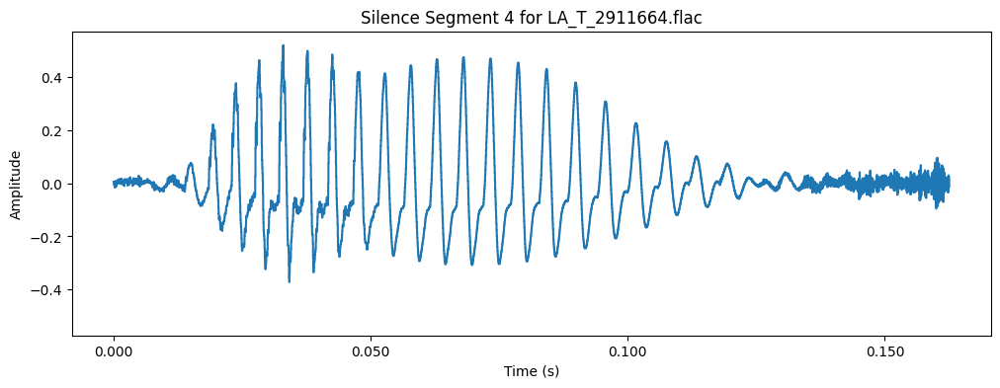

Playing silence segment 5 from LA_T_2911664.flac


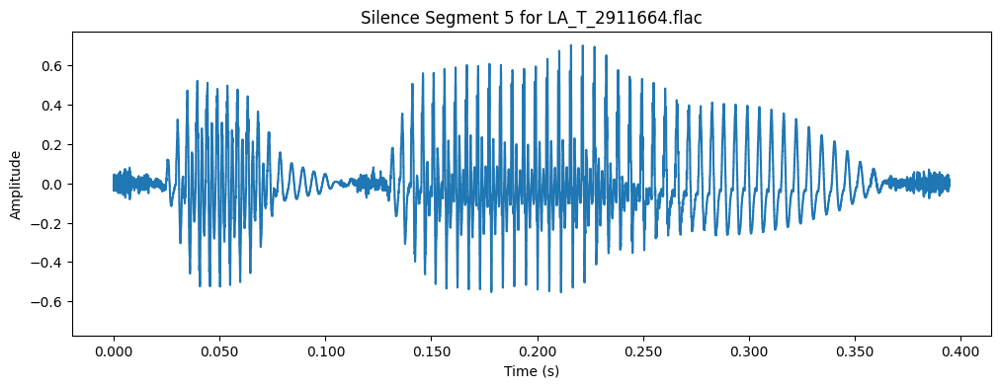

Playing silence segment 6 from LA_T_2911664.flac


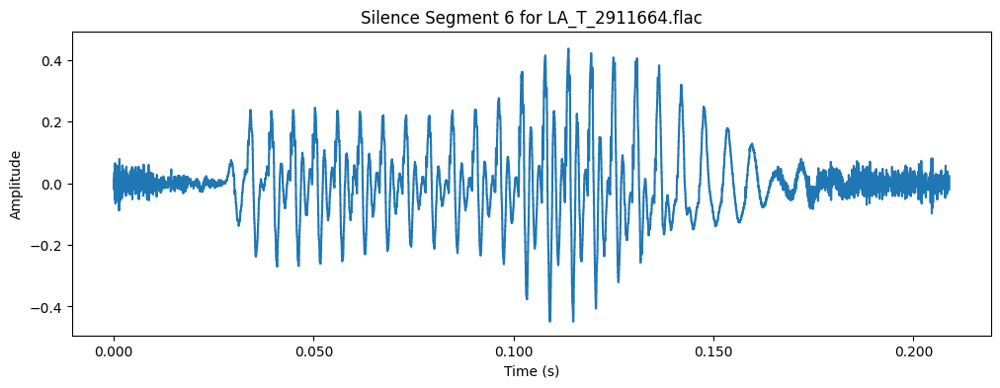

Playing silence segment 7 from LA_T_2911664.flac


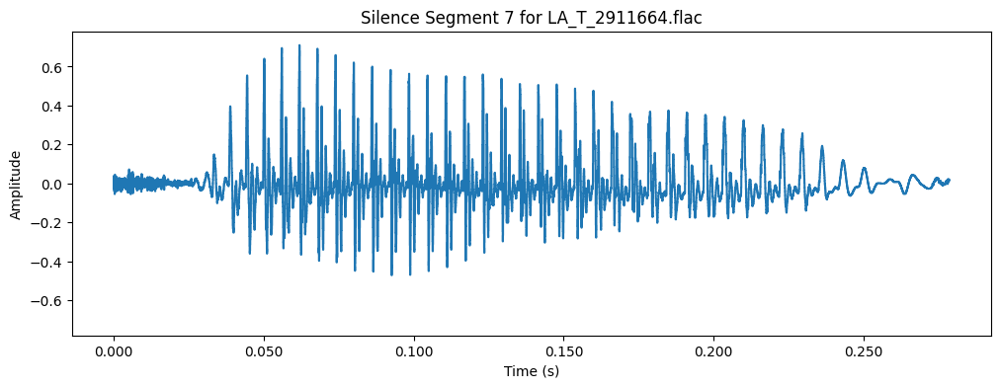

Playing silence segment 1 from LA_T_2910603.flac


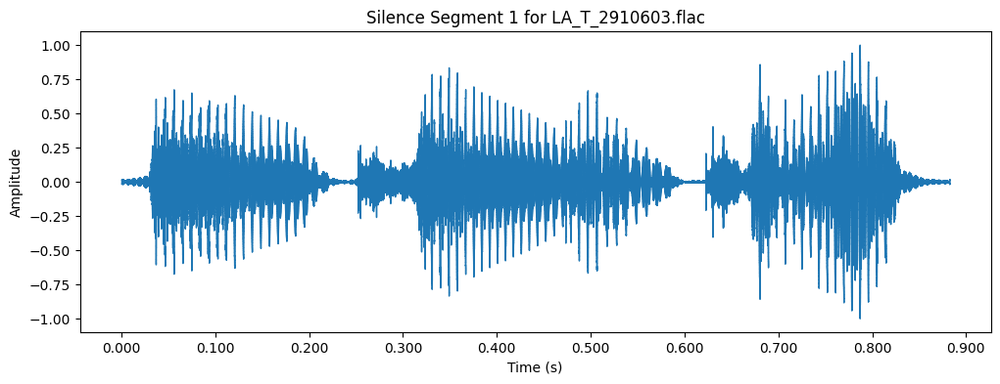

Playing silence segment 2 from LA_T_2910603.flac


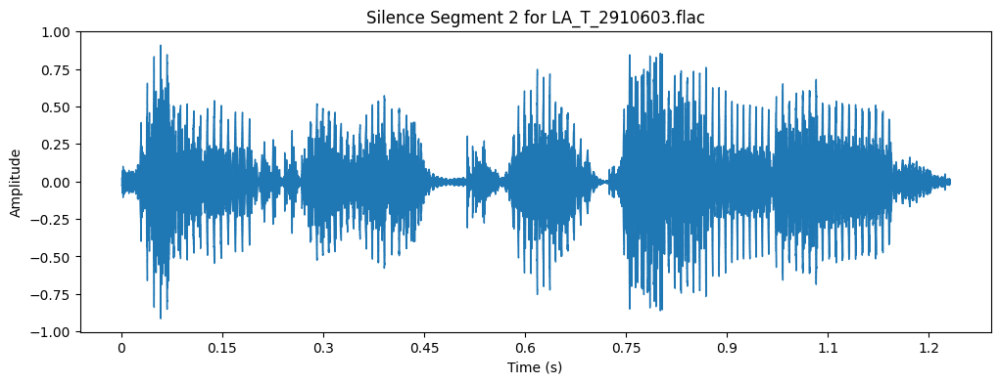

Playing silence segment 1 from LA_T_2909374.flac


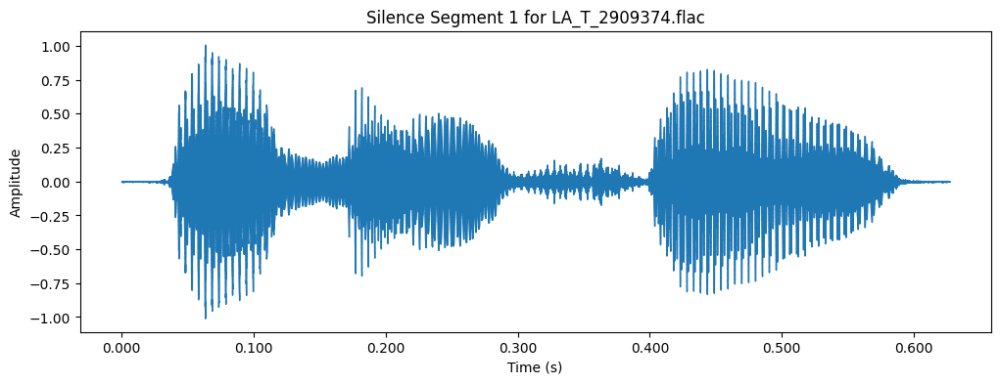

Playing silence segment 2 from LA_T_2909374.flac


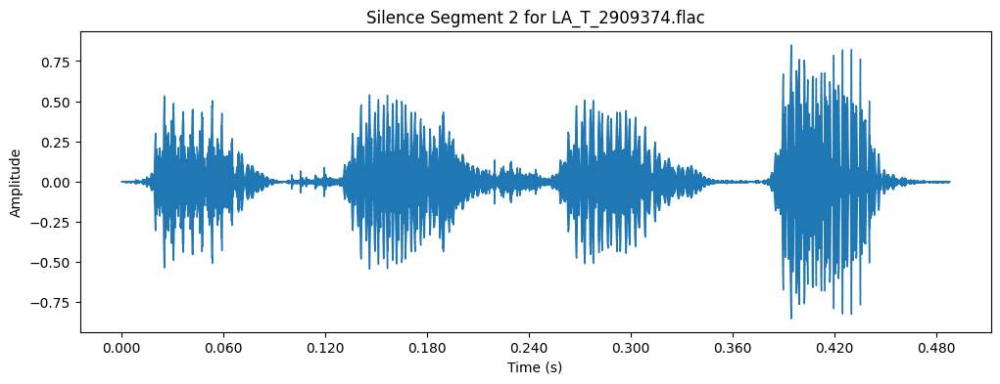

Playing silence segment 3 from LA_T_2909374.flac


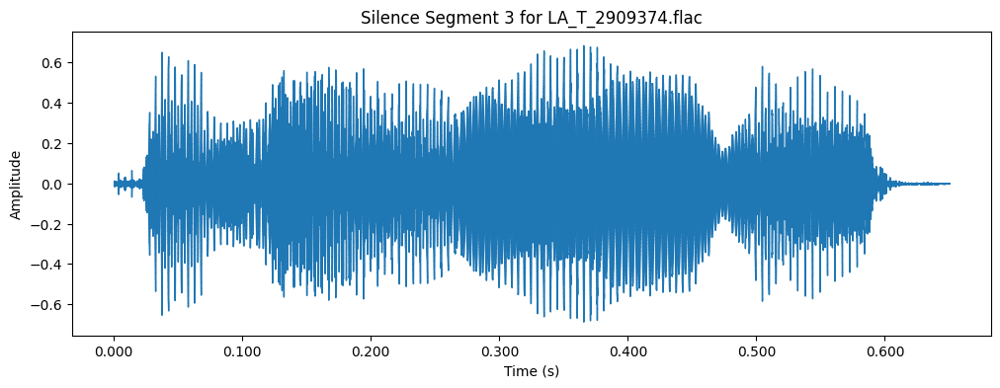

Playing silence segment 4 from LA_T_2909374.flac


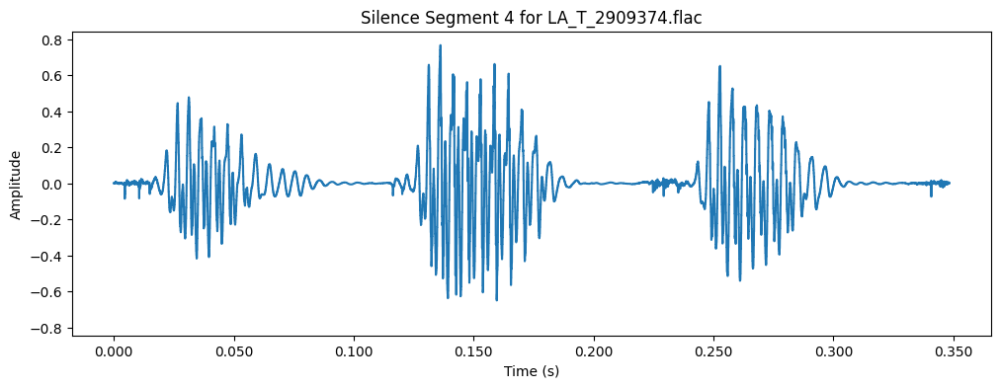

Playing silence segment 5 from LA_T_2909374.flac


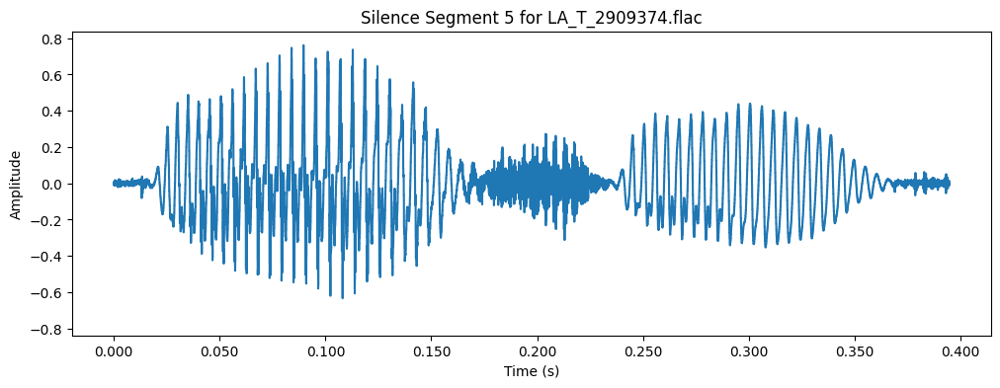

Playing silence segment 6 from LA_T_2909374.flac


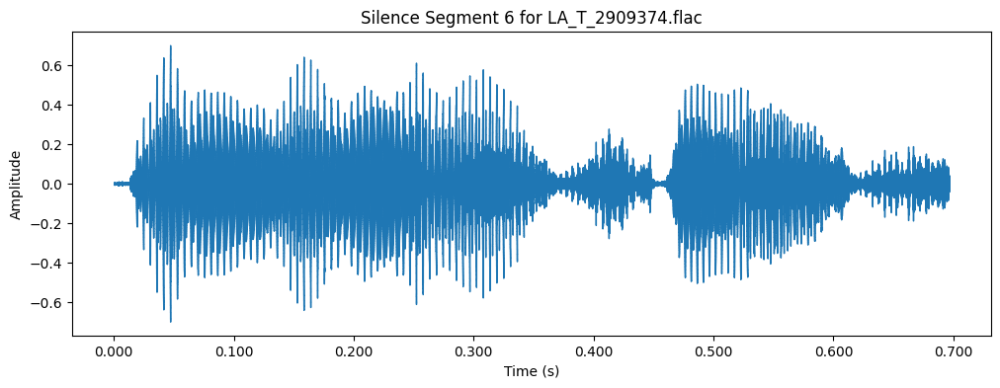

Playing silence segment 7 from LA_T_2909374.flac


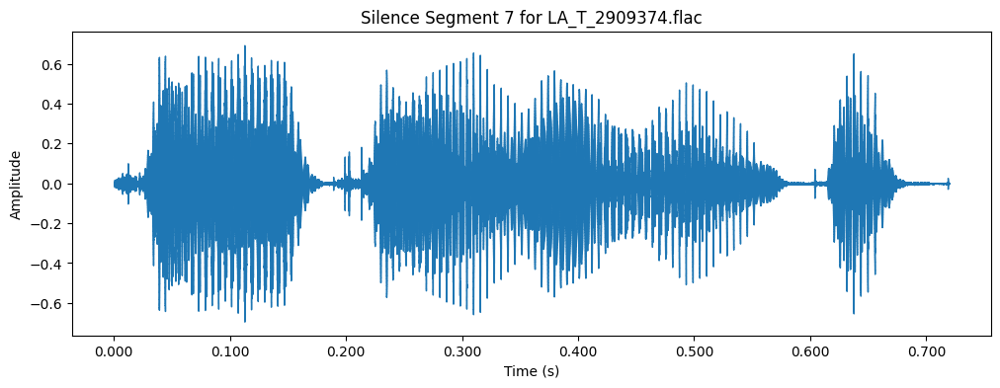

Playing silence segment 8 from LA_T_2909374.flac


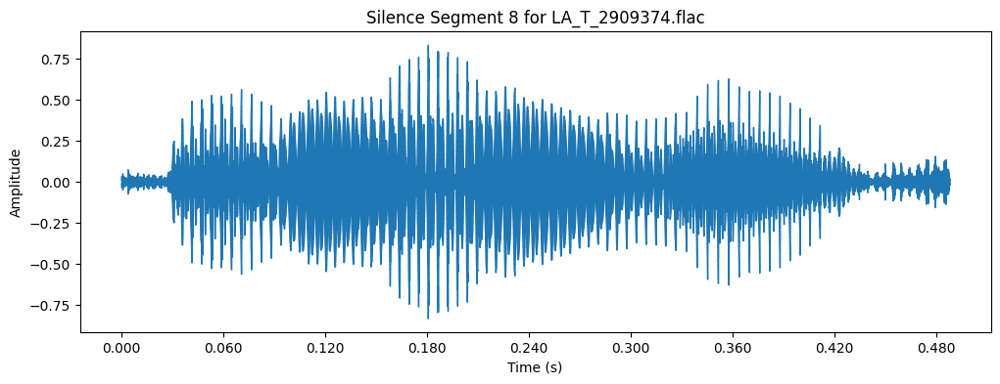

Playing silence segment 9 from LA_T_2909374.flac


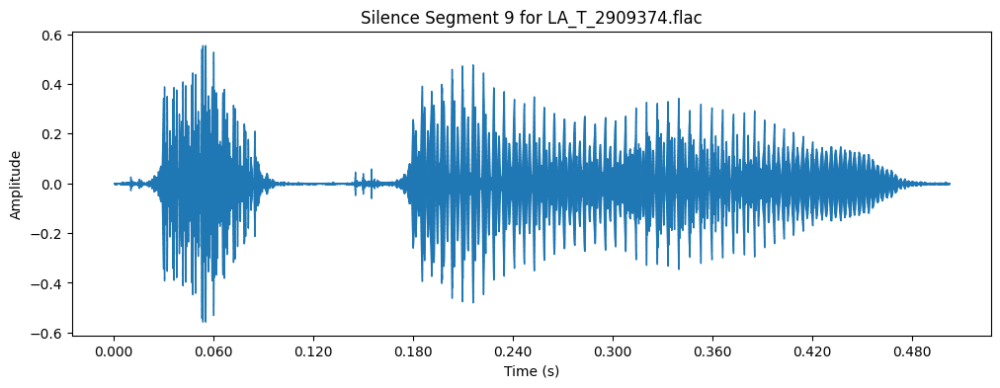

In [11]:
# prompt: put togheter the silence part of the same audio

# Assuming audio_files and the silence segments are already extracted as in the previous code

# Concatenate all silence segments into a single audio array
all_silence = np.concatenate(silence)

# Play the combined silence
print("Playing all combined silence segments")
ipd.display(ipd.Audio(all_silence, rate=sr))

# Example: save the combined silence to a file
librosa.output.write_wav("combined_silence.wav", all_silence, sr)